In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import json
import os
from dataAnalyze import DataAnalyze
import random

from scipy.stats import linregress



In [166]:
cd data/processed/v1/eyetracking/25-02-07-1440_setting0

/Users/wangying/Desktop/PupilDilationPsychopy/pdData/data/processed/v1/eyetracking/25-02-07-1440_setting0


In [164]:

def adjust_trial_index(eye_data):
    """
    Adjust the trial index so that it increases sequentially across blocks.
    Assumes that each block contains 30 trials and the trial index resets at each block.
    """
    previous_i = 0  # Track previous trial index
    block_count = 0  # Track block count

    for i, trial in enumerate(eye_data['trial_index']):
        if trial < previous_i:  # If trial index resets, increment block count
            block_count += 1
        
        # Update trial index to be continuous
        eye_data.at[i, 'trial_index'] = trial + (block_count * 30)
        
        previous_i = trial  # Update previous trial index for next iteration

    return eye_data




In [3]:
panos_eye = pd.read_csv('data/processed/v1/eyetracking/25-02-07-1440_setting0/all_adin.csv')
# panos_eye = adjust_trial_index(_panos_eye) 


In [167]:
#panos_eye.to_csv("all_adin.csv", index=False)

In [4]:


def fetch_log(path):
    complete_path = os.path.join('data', 'processed', 'v1', 'logs', path + '.json')
    
    try:
        with open(complete_path, 'r', encoding='utf-8') as f:  # Explicit encoding
            file = json.load(f)
            return pd.DataFrame(file)
    except FileNotFoundError:
        print(f"Error: The file '{complete_path}' was not found.")
    except json.JSONDecodeError:
        print(f"Error: The file '{complete_path}' is not a valid JSON file.")
    except Exception as e:
        print(f"Unexpected error: {e}")



In [5]:
panos_log = fetch_log('25-02-07-1440_setting0')

In [6]:
panos = DataAnalyze(panos_eye, panos_log)


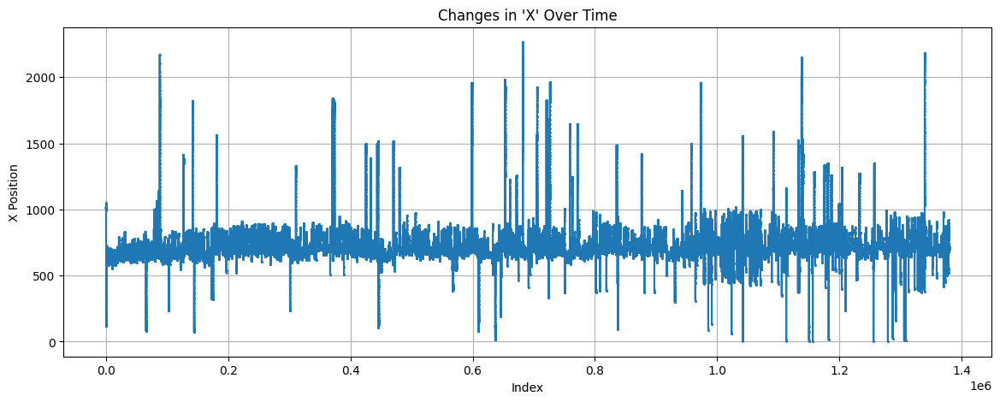

In [326]:

# Filter the data
test_data = panos.eye_data[panos.eye_data['Pupil'].notna()]

# Plot 'X' over time or index
plt.figure(figsize=(14, 5))  # Increase width
plt.plot(test_data.index, test_data['X'], marker='o', markersize=1, linestyle='-')

# Labels and title
plt.xlabel("Index")
plt.ylabel("X Position")
plt.title("Changes in 'X' Over Time")
plt.grid()

# Show the plot
plt.show()


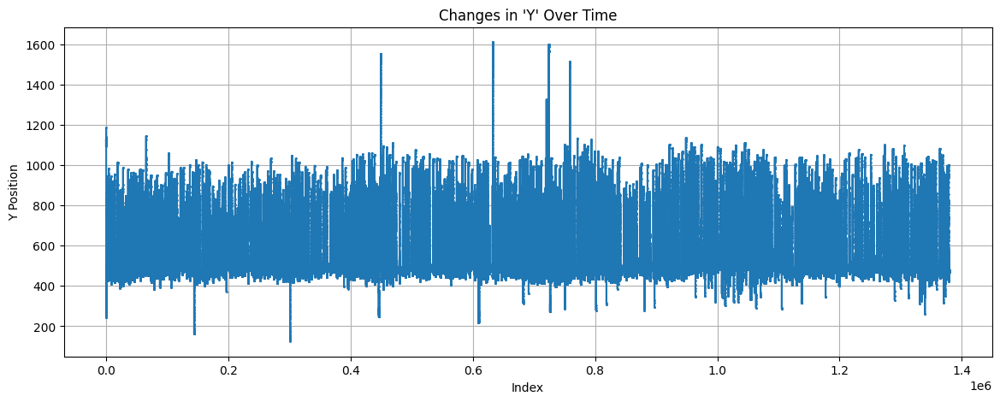

In [325]:


# Plot 'X' over time or index
plt.figure(figsize=(14, 5))  # Increase width
plt.plot(test_data.index, test_data['Y'], marker='o', markersize=1, linestyle='-')

# Labels and title
plt.xlabel("Index")
plt.ylabel("Y Position")
plt.title("Changes in 'Y' Over Time")
plt.grid()

# Show the plot
plt.show()

# Count Incorrect Trial

In [10]:
(panos.log_data["performance"] == "Incorrect").sum()  # If 'incorrect' is a string


14

In [13]:
incorrect_trials = panos.log_data.loc[panos.log_data["performance"] == "Incorrect", "trial_index"]
incorrect_trials

3        4
13      14
22      23
28      29
51      52
56      57
100    101
109    110
155    156
175    176
217    218
221    222
248    249
254    255
Name: trial_index, dtype: int64

In [17]:
bins = np.arange(1, 271, 30)  # Creates bins [1-30, 31-60, ..., 241-270]
bins = np.append(bins, 271)  # Ensures the last bin includes 270

# Define bin labels
bin_labels = [f"{i}-{i+29}" for i in bins[:-1]]

# Count incorrect trials in each bin
bin_counts = pd.cut(incorrect_trials, bins=bins, right=True, labels=bin_labels).value_counts().sort_index()

# Print results
print("Incorrect trial counts per range:")
print(bin_counts)

Incorrect trial counts per range:
trial_index
1-30       4
31-60      2
61-90      0
91-120     2
121-150    0
151-180    2
181-210    0
211-240    2
241-270    2
Name: count, dtype: int64


# Plot rt

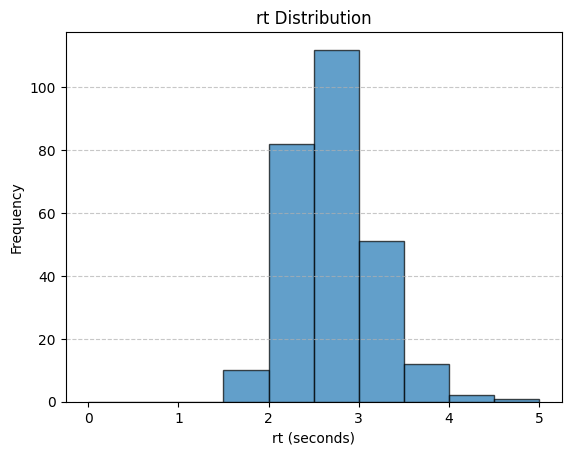

In [337]:

# Define bins (adjust based on your data range, now in seconds)
bins = np.arange(0, panos.log_data["rt"].max() + 0.5, 0.5)  # Binning in 0.5s intervals (adjust if needed)

# Create a histogram
plt.hist(panos.log_data["rt"], bins=bins, edgecolor='black', alpha=0.7)

# Labels and title
plt.xlabel("rt (seconds)")
plt.ylabel("Frequency")
plt.title("rt Distribution")
plt.grid(axis='y', linestyle="--", alpha=0.7)

# Show the plot
plt.show()


In [339]:
panos.log_data[panos.log_data["rt"] < 2] 
print(panos.log_data[panos.log_data["rt"] < 2].index)

Index([8, 9, 12, 48, 54, 121, 128, 137, 143, 246], dtype='int64')


In [340]:
panos.log_data[panos.log_data["rt"] < 2][["rt"]]

,rt
8,1.999797
9,1.884386
12,1.948281
48,1.963170
54,1.977662
121,1.992308
128,1.901269
137,1.950576
143,1.859870
246,1.839385


# Plot raw

/Users/wangying/Desktop/PupilDilationPsychopy/pdData/dataAnalyze.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pupil_data.loc[:, 'adTimeEvent'] = pupil_data['TimeEvent'] - self.getlog_t_pivot(trial_num) + self.pivot_since_trial_start


[]


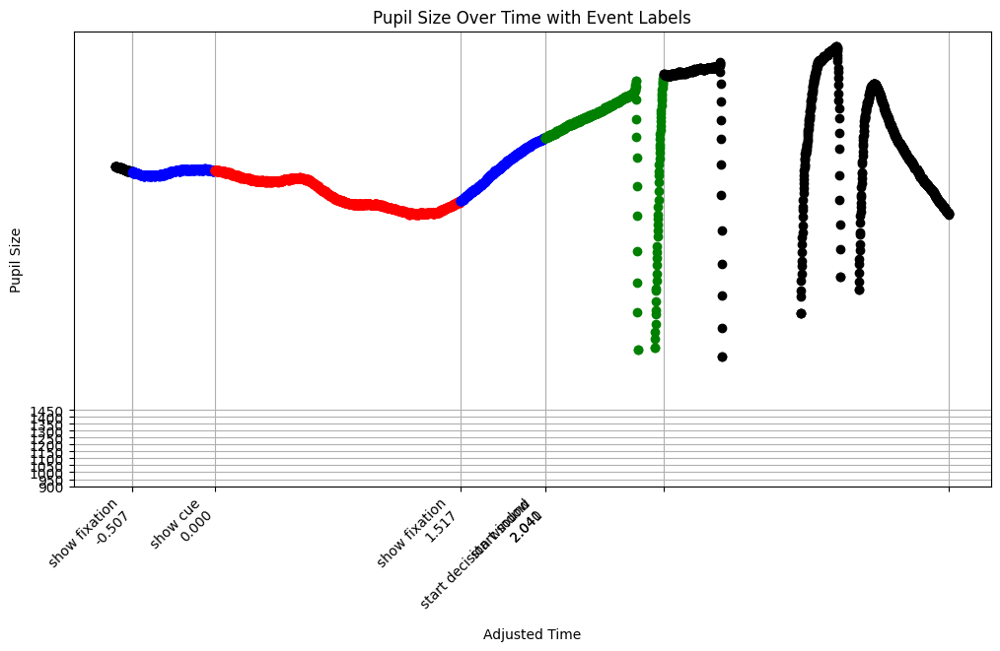

/Users/wangying/Desktop/PupilDilationPsychopy/pdData/dataAnalyze.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pupil_data.loc[:, 'adTimeEvent'] = pupil_data['TimeEvent'] - self.getlog_t_pivot(trial_num) + self.pivot_since_trial_start


[]


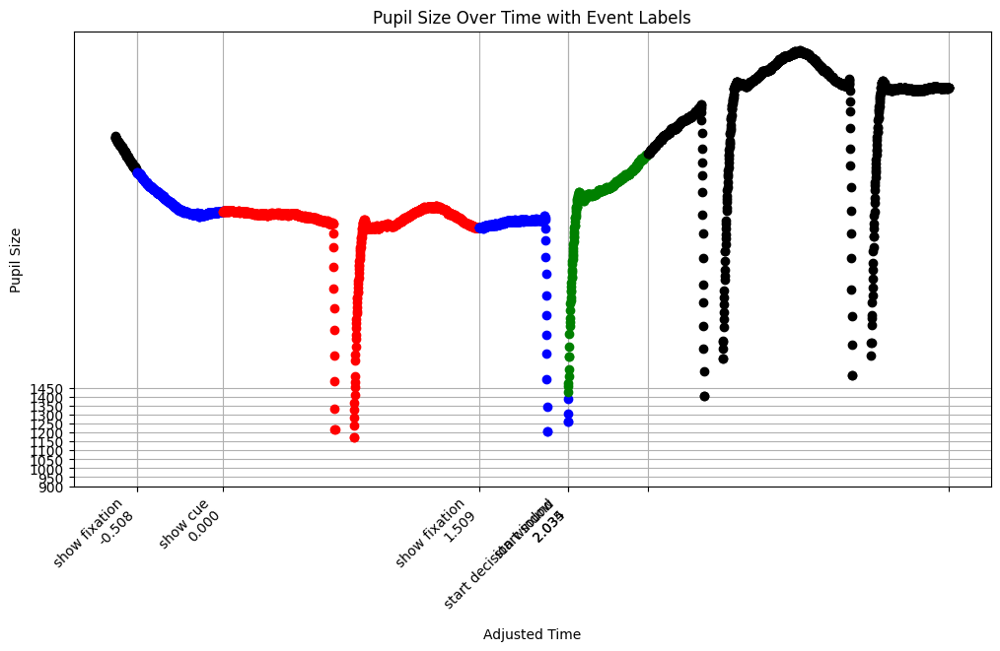

/Users/wangying/Desktop/PupilDilationPsychopy/pdData/dataAnalyze.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pupil_data.loc[:, 'adTimeEvent'] = pupil_data['TimeEvent'] - self.getlog_t_pivot(trial_num) + self.pivot_since_trial_start


[]


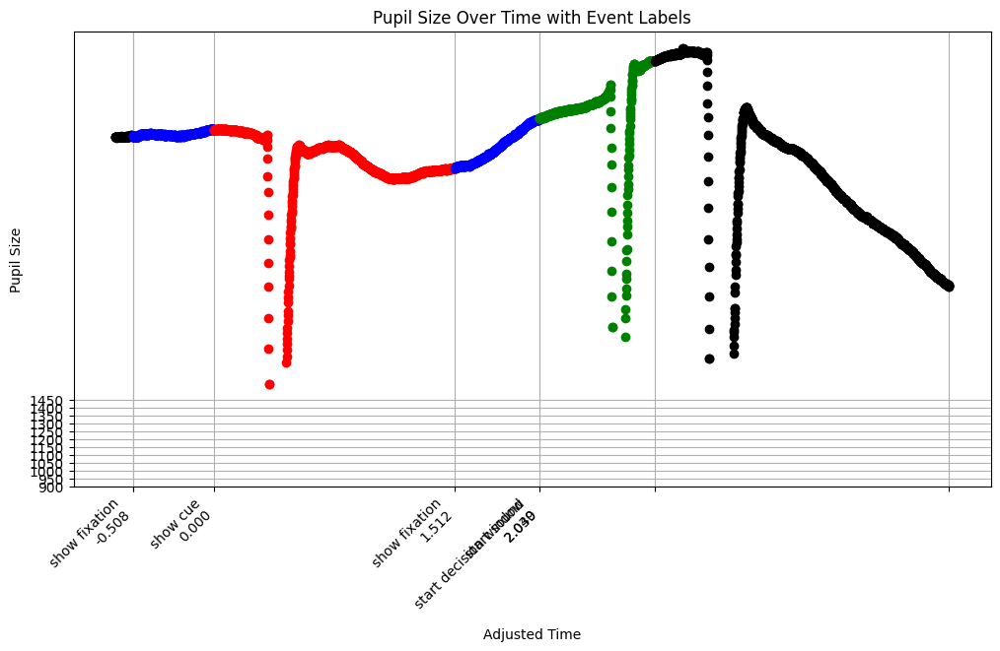

/Users/wangying/Desktop/PupilDilationPsychopy/pdData/dataAnalyze.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pupil_data.loc[:, 'adTimeEvent'] = pupil_data['TimeEvent'] - self.getlog_t_pivot(trial_num) + self.pivot_since_trial_start


[]


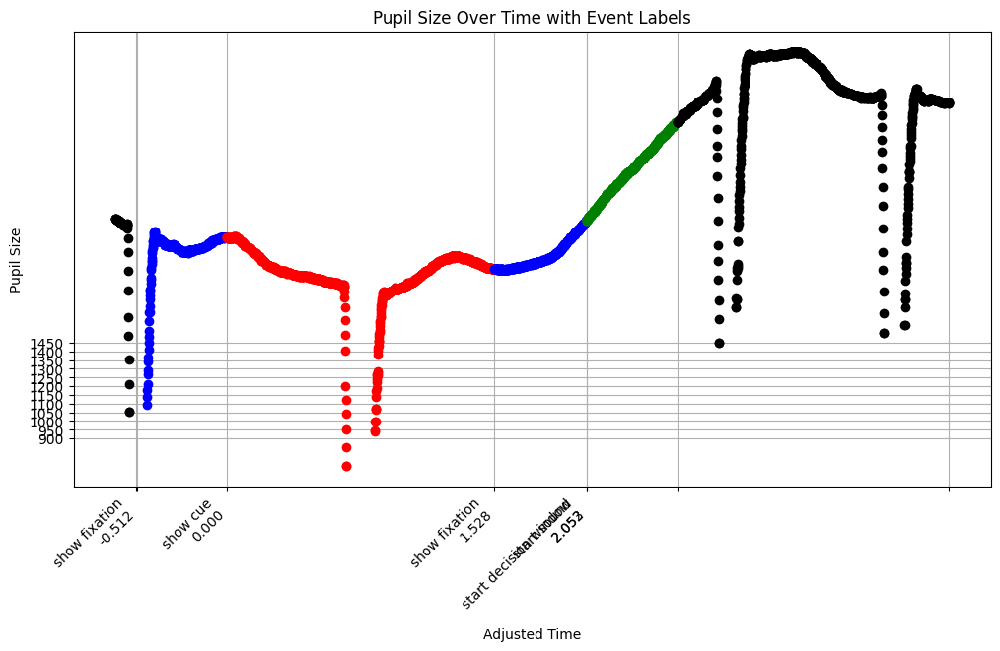

/Users/wangying/Desktop/PupilDilationPsychopy/pdData/dataAnalyze.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pupil_data.loc[:, 'adTimeEvent'] = pupil_data['TimeEvent'] - self.getlog_t_pivot(trial_num) + self.pivot_since_trial_start


[]


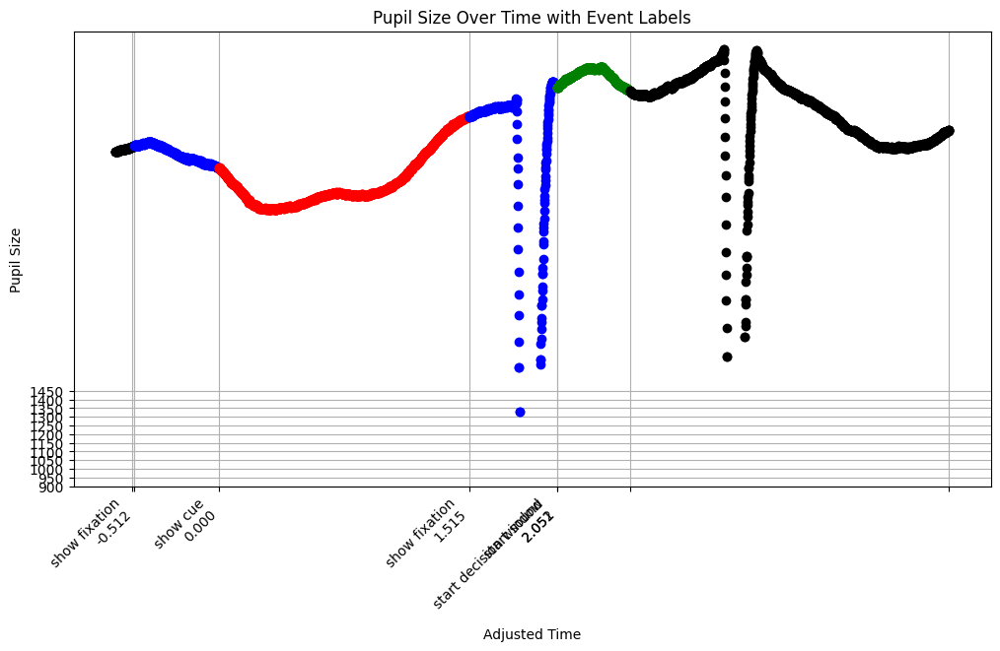

In [15]:
for i in [4,5,6,7,8]:
    panos.plot_pupil_size([i],normalized=False)

# Process Blink

## derivative

In [7]:

def calculate_pupil_differences(df):
    """
    Calculate differences and derivative for pupil data.

    Parameters:
    df (pd.DataFrame): DataFrame containing 'Pupil' and 'TimeEvent' columns.

    Returns:
    pd.DataFrame: Updated DataFrame with 'Pupil_diff', 'TimeEvent_diff', and 'Pupil_derivative' columns.
    """
    df = df.copy()  # Avoid modifying the original DataFrame
    
    # Calculate pupil size difference
    df['Pupil_diff'] = df['Pupil'].shift(-1) - df['Pupil']
    
    # Calculate time difference
    df['TimeEvent_diff'] = df['TimeEvent'].shift(-1) - df['TimeEvent']
    
    # Calculate pupil size derivative
    df['Pupil_derivative'] = df['Pupil_diff'] / df['TimeEvent_diff']
    
    # Drop NaN values (last row will have NaN due to shifting)
    df.dropna(subset=['Pupil_derivative'], inplace=True)
    
    return df



In [8]:

panos.eye_data = calculate_pupil_differences(panos.eye_data)



In [26]:
panos.eye_data['Pupil_derivative'].quantile(0.9)
#max 1130000.000026721
#min -1097999.999776308


2999.9999993888196

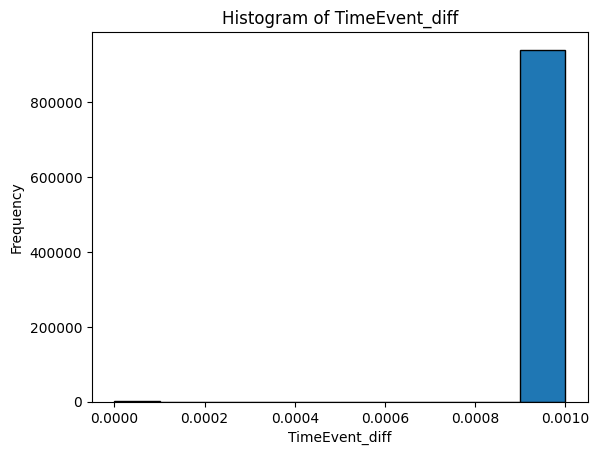

In [38]:
bins = np.arange(0, 0.0011, 0.0001) 
plt.hist(panos.eye_data['TimeEvent_diff'],bins=bins, edgecolor='black')
plt.xlabel('TimeEvent_diff')
plt.ylabel('Frequency')
plt.title('Histogram of TimeEvent_diff')
plt.show()


In [39]:
panos.eye_data['TimeEvent_diff'].unique()

array([0.0004451, 0.007    , 0.001    , ..., 0.0007569, 0.0009775,
       0.0006531])

zoomed in?:  True


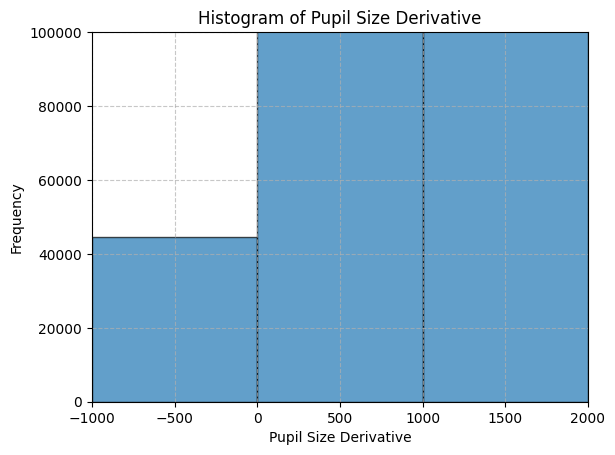

In [427]:
zoomed_in = True
# zoomed_in = False

print("zoomed in?: ", zoomed_in)

# Ensure the 'Pupil_derivative' column exists
if 'Pupil_derivative' in panos.eye_data.columns:
    if zoomed_in:
        bins = np.arange(-1000, 2001, 1000)  # Adjust bins step as needed

    else:
        bins = np.arange(-10000, 10001, 1000)  # Adjust bins step as needed
    
    # Create histogram of 'Pupil_derivative'
    plt.hist(panos.eye_data['Pupil_derivative'].dropna(), bins=bins, edgecolor='black', alpha=0.7)

    # Set the x-axis range
    if zoomed_in:
        plt.xlim(-1000, 2000)
    else:
        plt.xlim(-10000,10000)
    plt.ylim(0, 10**5)

    # Add labels and title
    plt.xlabel("Pupil Size Derivative")
    plt.ylabel("Frequency")
    plt.title("Histogram of Pupil Size Derivative")
    plt.grid(True, linestyle="--", alpha=0.7)

    # Show the plot
    plt.show()
else:
    print("Pupil_derivative column not found in the data.")



In [25]:
panos.eye_data['Pupil_derivative'].describe()

count    1.367064e+06
mean    -4.301201e+01
std      1.275516e+04
min     -1.098000e+06
25%      0.000000e+00
50%      0.000000e+00
75%      1.000000e+03
max      1.130000e+06
Name: Pupil_derivative, dtype: float64

zoomed in?:  False
-1098.0 1130.0


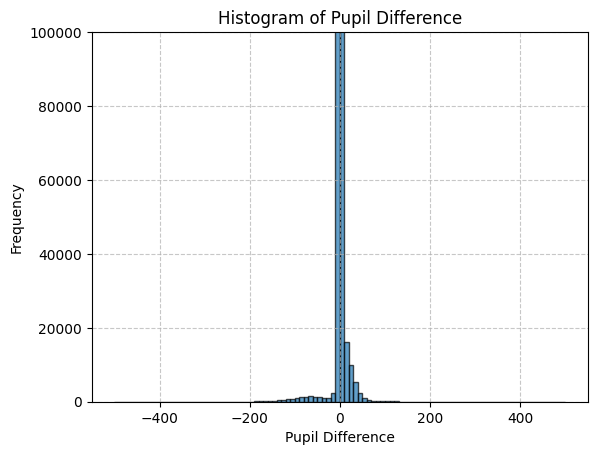

In [429]:
# SANITY CHECK: usually pupil dilates/contracts 1/2mm per second  
# zoomed_in = True
zoomed_in = False
print("zoomed in?: ", zoomed_in)

# Ensure 'Pupil_diff' column exists
if 'Pupil_diff' in panos.eye_data.columns:
    # Plot the histogram of pupil differences
    min_val = panos.eye_data['Pupil_diff'].min()
    max_val = panos.eye_data['Pupil_diff'].max()
    print(min_val,max_val)


    if zoomed_in:
        bins = np.arange(-10, 10, 1)  # Adjust bins step as needed
    else:
        bins = np.arange(-500, 501, 10)  # Adjust bins step as needed

    plt.hist(panos.eye_data['Pupil_diff'].dropna(), bins=bins, edgecolor='black', alpha=0.7)

    plt.ylim(0, 10**5)

    # Add labels and title
    plt.xlabel("Pupil Difference")
    plt.ylabel("Frequency")
    plt.title("Histogram of Pupil Difference")

    # Add grid for better visibility
    plt.grid(True, linestyle="--", alpha=0.7)

    # Show the plot
    plt.show()
else:
    print("Pupil_diff column not found in the data.")


In [24]:
panos.eye_data['Pupil_diff'].describe()

count    1.370685e+06
mean    -4.286032e-02
std      1.711506e+01
min     -1.098000e+03
25%      0.000000e+00
50%      0.000000e+00
75%      1.000000e+00
max      1.130000e+03
Name: Pupil_diff, dtype: float64

## Plotting 1 (filter out pupil size and derivative outliers)



In [52]:
def filter_eye_data_diff(eye_data, trial_index_list, diff_lower_bound, diff_upper_bound, derive_lower_bound,derive_upper_bound, window_size=110):
    """
    Plots pupil size over TimeEvent as a scatter plot for specified trial index list, 
    with a pupil difference filter and removes outliers based on a rolling 1000-point window.

    Parameters:
    - eye_data: DataFrame containing 'TimeEvent', 'Pupil', and 'trial_index' columns.
    - trial_index_list: List of trial indices to plot.
    - lower_bound: Lower bound for filtering 'Pupil_diff'.
    - upper_bound: Upper bound for filtering 'Pupil_diff'.
    """
    eye_data = eye_data[eye_data['trial_index'].isin(trial_index_list)].copy()
    eye_data = calculate_pupil_differences(eye_data)

    # Filter data by trial index and pupil difference range
    # filtered_data = eye_data[
    #     (eye_data['trial_index'].isin(trial_index_list)) &
    #     (eye_data['Pupil_diff'] >= diff_lower_bound) &
    #     (eye_data['Pupil_diff'] <= diff_upper_bound) &
    #     (eye_data['Pupil_derivative'] >= derive_lower_bound) &
    #     (eye_data['Pupil_derivative'] <= derive_upper_bound)
    # ].copy()  # Copy to avoid modifying original DataFrame

    filtered_data = eye_data[
        (eye_data['Pupil_diff'] >= diff_lower_bound) &
        (eye_data['Pupil_diff'] <= diff_upper_bound) 
    ]
    print("remain row number: ", len(filtered_data))
    return filtered_data


In [48]:


def filter_eye_data_diff(eye_data, trial_index_list, diff_lower_bound, diff_upper_bound, derive_lower_bound,derive_upper_bound, window_size=110):
    """
    Plots pupil size over TimeEvent as a scatter plot for specified trial index list, 
    with a pupil difference filter and removes outliers based on a rolling 1000-point window.

    Parameters:
    - eye_data: DataFrame containing 'TimeEvent', 'Pupil', and 'trial_index' columns.
    - trial_index_list: List of trial indices to plot.
    - lower_bound: Lower bound for filtering 'Pupil_diff'.
    - upper_bound: Upper bound for filtering 'Pupil_diff'.
    """
    # Filter data by trial index and pupil difference range
    # filtered_data = eye_data[
    #     (eye_data['trial_index'].isin(trial_index_list)) &
    #     (eye_data['Pupil_diff'] >= diff_lower_bound) &
    #     (eye_data['Pupil_diff'] <= diff_upper_bound) &
    #     (eye_data['Pupil_derivative'] >= derive_lower_bound) &
    #     (eye_data['Pupil_derivative'] <= derive_upper_bound)
    # ].copy()  # Copy to avoid modifying original DataFrame
    filtered_data = eye_data[
        (eye_data['trial_index'].isin(trial_index_list)) &
        (eye_data['Pupil_diff'] >= diff_lower_bound) &
        (eye_data['Pupil_diff'] <= diff_upper_bound) 
    ].copy()
    # # Compute rolling median and IQR for outlier detection
    # rolling_median = filtered_data['Pupil'].rolling(window=window_size, center=True).median()
    # rolling_iqr = filtered_data['Pupil'].rolling(window=window_size, center=True).quantile(0.55) - \
    #               filtered_data['Pupil'].rolling(window=window_size, center=True).quantile(0.40)
    
    # # Define outliers as points outside 1.5 * IQR from the rolling median
    # lower_outlier_bound = rolling_median - 1.5 * rolling_iqr
    # upper_outlier_bound = rolling_median + 1.5 * rolling_iqr
    
    # # Remove outliers
    # filtered_data = filtered_data[
    #     (filtered_data['Pupil'] >= lower_outlier_bound) & 
    #     (filtered_data['Pupil'] <= upper_outlier_bound)
    # ]
    print(len(filtered_data))
    # Scatter plot
    plt.figure(figsize=(10, 6))
    for trial_index in trial_index_list:
        trial_data = filtered_data[filtered_data['trial_index'] == trial_index]
        plt.scatter(trial_data['TimeEvent'], trial_data['Pupil'], label=f'Trial {trial_index}', alpha=0.6)
    
    # Adding labels and title
    plt.xlabel('TimeEvent (ms)')
    plt.ylabel('Pupil Size (mm)')
    plt.title('Pupil Size Over Time for Selected Trials (Filtered Scatter Plot)')
    plt.legend()
    plt.grid(True)
    plt.show()


2161


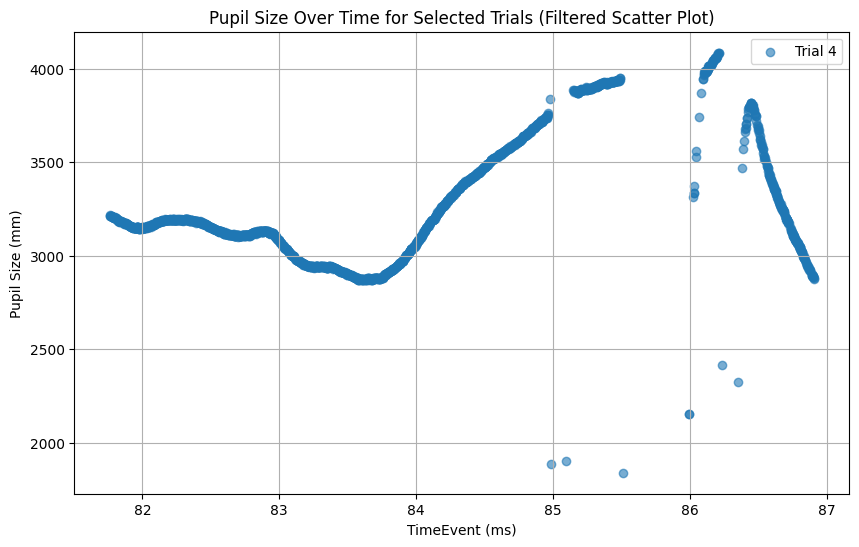

In [49]:
plot_pupil_size_over_time_filtered(panos.eye_data,[4],-0.5,0.5,-1000, 2000, 110)

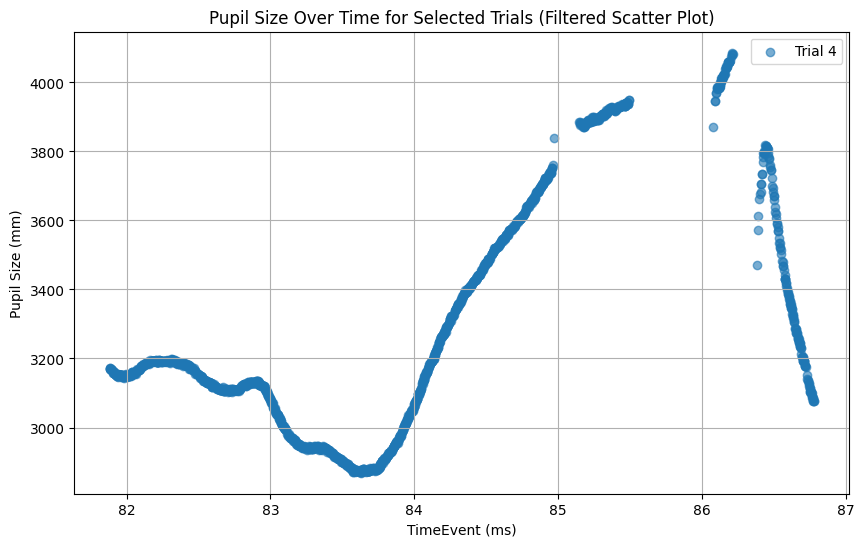

In [131]:
plot_pupil_size_over_time_filtered(panos.eye_data,[4],-0.002,0.002,110)

## plotting 2 (process blink locally)


In [79]:
def process_blink(eye_data,inner_bound=0.2, outer_bound=0.22):
    print("origional data length: ", len(eye_data))
    # Step 1: Filter data by trial index
    # eyedatacopy = eye_data[eye_data['trial_index'].isin(trial_index_list)].copy()

    # Step 2: Identify blinks and their timing
    blink_data = eye_data[eye_data['Type'] == 'Blink'][['Start', 'End']]

    before_pupil_sizes = []
    after_pupil_sizes = []

    # Step 3: Compute average pupil size before and after each blink
    for _, blink in blink_data.iterrows():
        start_time = blink['Start']
        end_time = blink['End']

        before_data = eye_data[(eye_data['TimeEvent'] >= start_time - outer_bound) &
                                  (eye_data['TimeEvent'] < start_time - inner_bound)]
        avg_before = before_data['Pupil'].mean()

        after_data = eye_data[(eye_data['TimeEvent'] > end_time + inner_bound) &
                                 (eye_data['TimeEvent'] <= end_time + outer_bound)]
        avg_after = after_data['Pupil'].mean()

        before_pupil_sizes.append(avg_before)
        after_pupil_sizes.append(avg_after)

    blink_data['Avg_Pupil_Before'] = before_pupil_sizes
    blink_data['Avg_Pupil_After'] = after_pupil_sizes
    print(blink_data)


    # Step 4: Remove invalid pupil size values during blinks
    pupil_data = eye_data[eye_data['Pupil'].notna()]

    selected_data = []

    for _, row in pupil_data.iterrows():
        valid = True
        for _, blink in blink_data.iterrows():
            if blink['Start'] - 0.05 <= row['TimeEvent'] <= blink['End'] + 0.05:
                print("checking validity")
                avg_before = blink['Avg_Pupil_Before']
                avg_after = blink['Avg_Pupil_After']
                if not (avg_before <= row['Pupil'] <= avg_after):
                    valid = False
                    break
        if valid:
            selected_data.append(row)

    selected_data = pd.DataFrame(selected_data)
    print("remain row number: ", len(selected_data))

    return selected_data

In [77]:
trial_4_data = panos.eye_data[panos.eye_data['trial_index'] == 4]


In [71]:
len(
    trial_4_data
)

4461

In [80]:
process_blink(trial_4_data)

origional data length:  4479
           Start        End  Avg_Pupil_Before  Avg_Pupil_After
18716  84.988605  85.091605           3633.90          3903.35
19139  85.510688  85.990688           3903.35          4070.05
19390  86.239688  86.350688           3367.80          3484.25
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity
checking validity

,Type,Event,Time,TimeEvent,Offset,trial_index,X,Y,Pupil,event,...,Eye,Start_X,Start_Y,End_X,End_Y,Amplitude,Peak_Velocity,Pupil_diff,TimeEvent_diff,Pupil_derivative
15476,Gaze,NaN,NaN,81.759357,NaN,4,620.4,472.1,3218.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.001000,2000.0
15477,Gaze,NaN,NaN,81.760357,NaN,4,620.6,471.9,3220.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001000,0.0
15478,Gaze,NaN,NaN,81.761357,NaN,4,620.8,471.9,3220.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,0.001000,-2000.0
15479,Gaze,NaN,NaN,81.762357,NaN,4,620.8,472.1,3218.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,0.001000,-2000.0
15480,Gaze,NaN,NaN,81.763357,NaN,4,620.6,472.2,3216.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,0.001000,-2000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19947,Gaze,NaN,NaN,86.906688,NaN,4,635.8,491.8,2874.0,response,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001000,0.0
19948,Gaze,NaN,NaN,86.907688,NaN,4,636.1,491.8,2874.0,response,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000903,NaN
19950,Gaze,NaN,NaN,86.908591,NaN,4,636.8,491.8,2874.0,done,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,458.0,NaN,NaN
19951,Fixation,NaN,NaN,NaN,NaN,4,627.9,486.0,3332.0,done,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-464.0,NaN,NaN


In [ ]:
def process_blink(eye_data,inner_bound=0.2, outer_bound=0.22):
    # print("origional data length: ", len(eye_data))
    # Step 1: Filter data by trial index
    # eyedatacopy = eye_data[eye_data['trial_index'].isin(trial_index_list)].copy()

    # Step 2: Identify blinks and their timing
    blink_data = eye_data[eye_data['Type'] == 'Blink'][['Start', 'End']]

    before_pupil_sizes = []
    after_pupil_sizes = []

    # Step 3: Compute average pupil size before and after each blink
    for _, blink in blink_data.iterrows():
        start_time = blink['Start']
        end_time = blink['End']

        before_data = eye_data[(eye_data['TimeEvent'] >= start_time - outer_bound) &
                                  (eye_data['TimeEvent'] < start_time - inner_bound)]
        avg_before = before_data['Pupil'].mean()

        after_data = eye_data[(eye_data['TimeEvent'] > end_time + inner_bound) &
                                 (eye_data['TimeEvent'] <= end_time + outer_bound)]
        avg_after = after_data['Pupil'].mean()

        before_pupil_sizes.append(avg_before)
        after_pupil_sizes.append(avg_after)

    blink_data['Avg_Pupil_Before'] = before_pupil_sizes
    blink_data['Avg_Pupil_After'] = after_pupil_sizes
    print(blink_data)


    # Step 4: Remove invalid pupil size values during blinks
    pupil_data = eye_data[eye_data['Pupil'].notna()]

    selected_data = []

    for _, row in pupil_data.iterrows():
        valid = True
        for _, blink in blink_data.iterrows():
            if blink['Start'] - 0.05 <= row['TimeEvent'] <= blink['End'] + 0.05:
                print("checking validity")
                avg_before = blink['Avg_Pupil_Before']
                avg_after = blink['Avg_Pupil_After']
                if not (avg_before <= row['Pupil'] <= avg_after):
                    valid = False
                    break
        if valid:
            selected_data.append(row)

    selected_data = pd.DataFrame(selected_data)
    # print("remain row number: ", len(selected_data))

    return selected_data

# Process Blink Functions 

In [6]:
def calculate_pupil_differences(df):
    """
    Calculate differences and derivative for pupil data.

    Parameters:
    df (pd.DataFrame): DataFrame containing 'Pupil' and 'TimeEvent' columns.

    Returns:
    pd.DataFrame: Updated DataFrame with 'Pupil_diff', 'TimeEvent_diff', and 'Pupil_derivative' columns.
    """
    df = df.copy()  # Avoid modifying the original DataFrame
    
    # Calculate pupil size difference
    df['Pupil_diff'] = df['Pupil'].shift(-1) - df['Pupil']
    
    # Calculate time difference
    df['TimeEvent_diff'] = df['TimeEvent'].shift(-1) - df['TimeEvent']
    
    # Calculate pupil size derivative
    df['Pupil_derivative'] = df['Pupil_diff'] / df['TimeEvent_diff']
    
    # Drop NaN values (last row will have NaN due to shifting)
    df.dropna(subset=['Pupil_derivative'], inplace=True)
    
    return df

In [153]:
def record_blink(eye_data):
    blink_data = eye_data[eye_data['Type'] == 'Blink'][['Start', 'End']].copy()
    return blink_data

def find_pupil_bounds_around_blink(eye_data, blink_data, inner_bound=0.2, outer_bound=0.22):
    before_pupil_sizes = []
    after_pupil_sizes = []

    for _, blink in blink_data.iterrows():
        start_time = blink['Start']
        end_time = blink['End']

        before_data = eye_data[(eye_data['TimeEvent'] >= start_time - outer_bound) &
                                  (eye_data['TimeEvent'] < start_time - inner_bound)]
        avg_before = before_data['Pupil'].mean()

        after_data = eye_data[(eye_data['TimeEvent'] > end_time + inner_bound) &
                                 (eye_data['TimeEvent'] <= end_time + outer_bound)]
        avg_after = after_data['Pupil'].mean()

        before_pupil_sizes.append(avg_before)
        after_pupil_sizes.append(avg_after)
    return before_pupil_sizes, after_pupil_sizes

def select_valid_pupil_size(eye_data, blink_data, check_bound=0.2):

    pupil_data = eye_data[eye_data['Pupil'].notna()]
    #print("before blink process:", len(pupil_data))

    selected_data = []

    for _, row in pupil_data.iterrows():
        valid = True
        for _, blink in blink_data.iterrows():
            if blink['Start'] - check_bound <= row['TimeEvent'] <= blink['End'] + check_bound:
                #print("checking validity")
                avg_before = blink['Avg_Pupil_Before']
                avg_after = blink['Avg_Pupil_After']
                if not (avg_before <= row['Pupil'] <= avg_after):
                    valid = False
                    break
        if valid:
            selected_data.append(row)

    selected_data = pd.DataFrame(selected_data)
    return selected_data



In [419]:
def plot_pupil_size(pupil_data,size=3, figsize = (10,6)):
    if 'TimeEvent' in pupil_data.columns and 'Pupil' in pupil_data.columns:
        if len(pupil_data['trial_index'].unique()) == 1:
            trial_index = pupil_data['trial_index'].iloc[0]
        else:
            trial_index = "Multiple trials"  
        plt.figure(figsize=figsize)
        plt.scatter(pupil_data['TimeEvent'], pupil_data['Pupil'], color='blue', alpha=0.6,s=size, label='Pupil Size')
        plt.title(f'Pupil Size Over TimeEvent - Trial {trial_index}')        
        plt.xlabel('TimeEvent')
        plt.ylabel('Pupil Size')
        plt.legend()
        plt.grid(True)
        plt.show()

In [147]:
def filter_eye_data_diff_blink(eye_data, trial_index_list, rep = 3, dot_size = 4, diff_lower_bound=-2, diff_upper_bound=2, alpha_inner=0.5, alpha_outer = 0.5, inner_bound=0.2, outer_bound=0.22, plot = False):

    eye_data = eye_data[eye_data['trial_index'].isin(trial_index_list)].copy()

    blink_data = record_blink(eye_data)
    #print(blink_data)

 

    for rep in range(rep):
 
        #find reasonable pupil size bound
        Avg_Pupil_Before, Avg_Pupil_After = find_pupil_bounds_around_blink(eye_data, blink_data, inner_bound=inner_bound, outer_bound=outer_bound)
        # print("Pupil bounds before blink: ", Avg_Pupil_Before, "Pupil bounds after blink: ", Avg_Pupil_After)
        blink_data['Avg_Pupil_Before'] = Avg_Pupil_Before
        blink_data['Avg_Pupil_After'] = Avg_Pupil_After

        # exclude unreasonable pupil size
        eye_data = select_valid_pupil_size(eye_data, blink_data)
        # print("row numbers after blink process: ", len(eye_data))
        
        #exclude unreasonable differences
        eye_data = calculate_pupil_differences(eye_data)

        eye_data = eye_data[
            (eye_data['Pupil_diff'] >= diff_lower_bound) &
            (eye_data['Pupil_diff'] <= diff_upper_bound) 
        ]

        #print("row number after diff filtering: ", len(eye_data))
        # plot_pupil_size(eye_data)
        
        #print("inner bound:", inner_bound,"outer bound", outer_bound)

        if rep == 0: 
            inner_bound=alpha_inner*inner_bound
            outer_bound=alpha_outer*outer_bound

    
    if plot:
        plot_pupil_size(eye_data, size=dot_size)

    return eye_data


In [133]:
86.403688-86.350688

0.05299999999999727

before blink process: 22956
row numbers after blink process:  18958
row number after diff filtering:  15892
inner bound: 0.2 outer bound 0.22
before blink process: 15892
row numbers after blink process:  14795
row number after diff filtering:  12362
inner bound: 0.1 outer bound 0.11
before blink process: 12362
row numbers after blink process:  12312
row number after diff filtering:  10722
inner bound: 0.1 outer bound 0.11


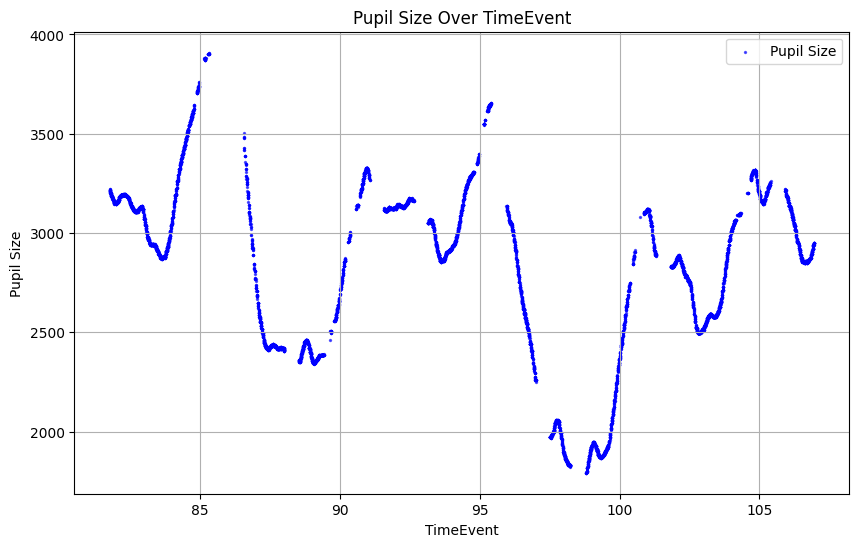

In [20]:
processed = filter_eye_data_diff_blink(panos.eye_data,[4,5,6,7,8],rep=3)

before blink process: 4999
row numbers after blink process:  4614
row number after diff filtering:  3738
0.2 0.22
before blink process: 3738
row numbers after blink process:  3672
row number after diff filtering:  2988
0.1 0.11
before blink process: 2988
row numbers after blink process:  2846
row number after diff filtering:  2434
0.05 0.055


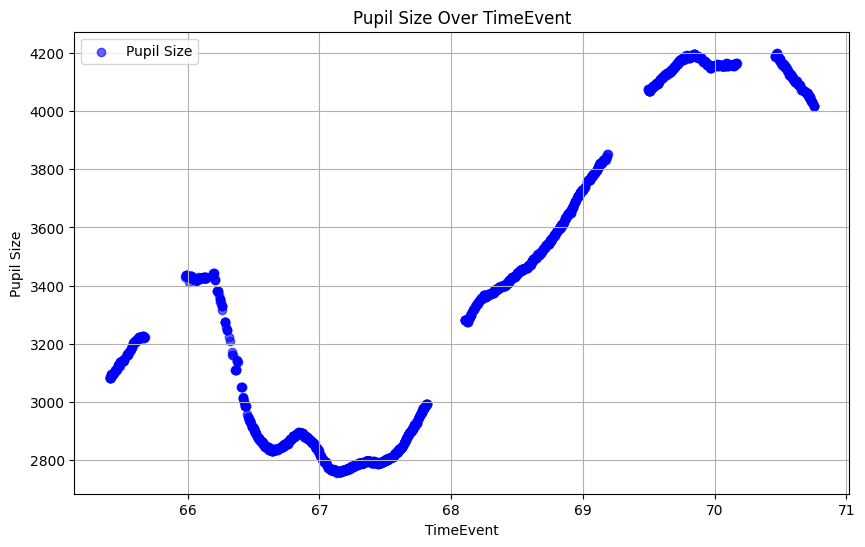

In [142]:
processed = filter_eye_data_diff_blink(panos.eye_data,[1],rep=3)

In [267]:
# old version
# def plot_pupil_data(trial_list, eye_data, clean_data=True):
#     """
#     Plots pupil size over time for specified trials, with optional data processing.

#     Parameters:
#         trial_list (list): List of trial indices to plot.
#         eye_data (pd.DataFrame): Raw eye-tracking DataFrame containing 'TimeEvent', 'Pupil', and 'trial_index'.
#         clean_data (bool): If True, processes the data before plotting.
#     """
#     if clean_data:
#         processed_data = process_pupil_data(eye_data,trial_list)  # Process the data
#     else:
#         processed_data = eye_data  # Use raw data

#     # Ensure required columns are present
#     if {'TimeEvent', 'Pupil', 'trial_index'}.issubset(processed_data.columns):
#         plt.figure(figsize=(10, 6))

#         for trial_index in trial_list:
#             trial_data = processed_data[processed_data['trial_index'] == trial_index]
#             plt.scatter(trial_data['TimeEvent'], trial_data['Pupil'], label=f'Trial {trial_index}', alpha=0.6)

#         # Adding labels and title
#         plt.xlabel('TimeEvent')
#         plt.ylabel('Pupil Size')
#         title_prefix = "Cleaned" if clean_data else "Raw"
#         plt.title(f'{title_prefix} Pupil Size Over Time for trial {trial_list}')
#         plt.legend()
#         plt.grid(True)
#         plt.show()
#     else:
#         print("Error: DataFrame must contain 'TimeEvent', 'Pupil', and 'trial_index' columns.")


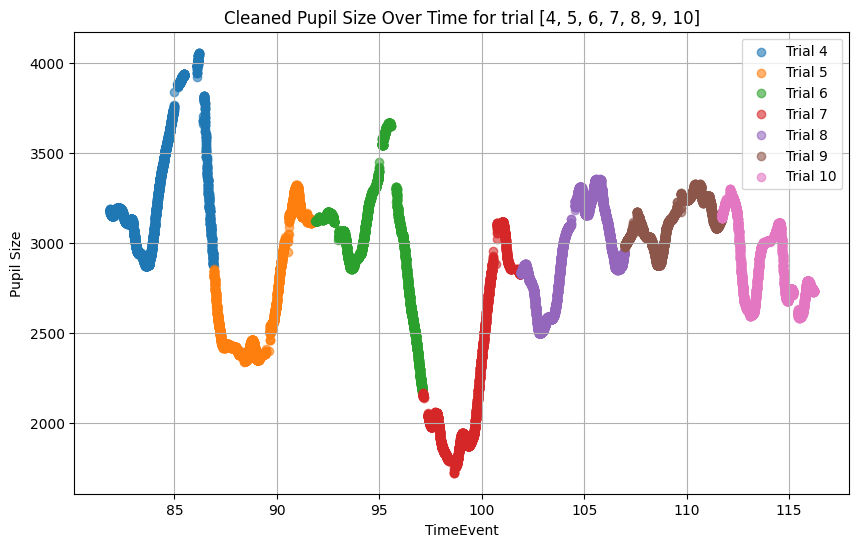

In [270]:
# old version 
plot_pupil_data([4,5,6,7,8,9,10],panos_eye)

# Pupil Plot Overview

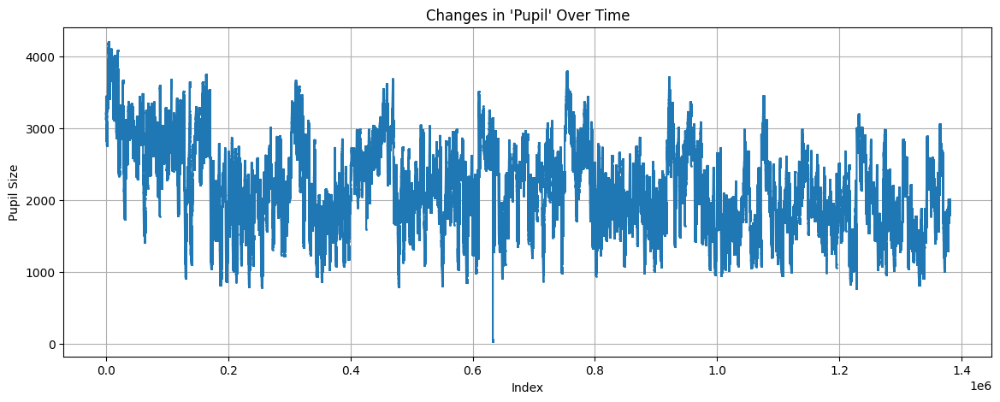

In [329]:
# old version

whole_exp_trial = list(range(1, 271))
# Filter the data
test_data = panos.eye_data[panos.eye_data['Pupil'].notna()]

processed_test_data = process_pupil_data(test_data, whole_exp_trial)

# Plot 'X' over time or index
plt.figure(figsize=(14, 5))  # Increase width
plt.plot(processed_test_data.index, processed_test_data['Pupil'], marker='o', markersize=1, linestyle='-')

# Labels and title
plt.xlabel("Index")
plt.ylabel("Pupil Size")
plt.title("Changes in 'Pupil' Over Time")
plt.grid()

# Show the plot
plt.show()


In [9]:
def bernoulli_entropy(p):
    """
    Computes the entropy of a Bernoulli random variable with probability p.
    """
    if p == 0 or p == 1:
        return 0  # log(0) is undefined, but entropy is 0 in these cases
    return -p * np.log2(p) - (1 - p) * np.log2(1 - p)

def block_entropy(p_x, p_y):
    """
    Computes the joint entropy of two independent Bernoulli random variables.
    """
    return bernoulli_entropy(p_x) + bernoulli_entropy(p_y)


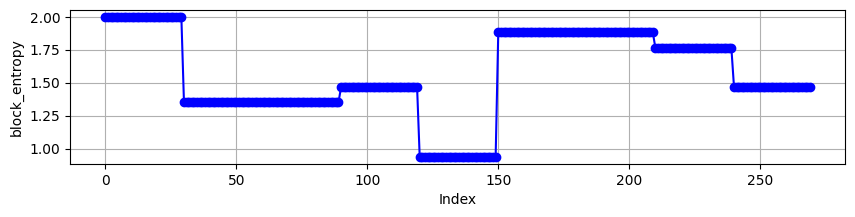

In [10]:

# Apply function to each row
panos.log_data['block_entropy'] = panos.log_data.apply(
    lambda row: block_entropy(row['left_cue_condition'], row['stimA_condition']), axis=1
)

plt.figure(figsize=(10, 2))
plt.plot(panos.log_data.index, panos.log_data['block_entropy'], marker='o', linestyle='-', color='b')

plt.xlabel("Index")
plt.ylabel("block_entropy")
plt.grid(True)

plt.show()

In [11]:
panos.log_data['block_entropy'].unique()

array([2.        , 1.35028649, 1.46899559, 0.93799119, 1.8812909 ,
       1.7625818 ])

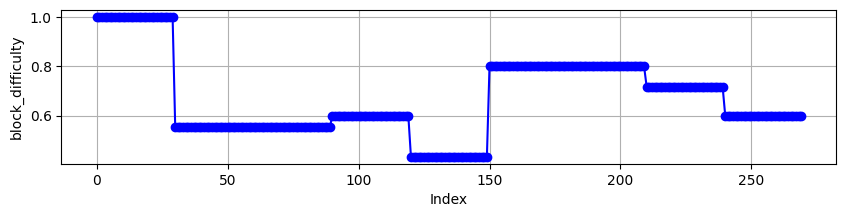

In [341]:
# old version

def block_difficulty(x, y):
    """Compute block difficulty as 1 - distance from (0.5, 0.5)."""
    return 1 - np.sqrt((x - 0.5)**2 + (y - 0.5)**2)

# Apply function to each row
panos.log_data['block_difficulty'] = panos.log_data.apply(
    lambda row: block_difficulty(row['left_cue_condition'], row['stimA_condition']), axis=1
)

plt.figure(figsize=(10, 2))
plt.plot(panos.log_data.index, panos.log_data['block_difficulty'], marker='o', linestyle='-', color='b')

plt.xlabel("Index")
plt.ylabel("block_difficulty")
plt.grid(True)

plt.show()

# Charaterize Surpirse Level 

In [360]:

def KLdivergence(prior, posterior, epsilon=1e-2):
    prior = np.array(prior)
    posterior = np.array(posterior)
    
    prior = np.where(prior <= 0, epsilon, prior)
    posterior = np.where(posterior <= 0, epsilon, posterior)
    
    divergence = 0
    for i in range(len(prior)):
        divergence += posterior[i] * np.log(posterior[i] / prior[i])
    
    return divergence

## sensory based

In [361]:
def sensory_posterior(stimulus):
    mapping = {
        'A|A': [1, 0, 0, 0],
        'A|B': [0, 1, 0, 0],
        'B|A': [0, 0, 1, 0],
        'B|B': [0, 0, 0, 1]
    }
    if stimulus not in mapping:
        print('stimulus not in mapping')
    return mapping.get(stimulus, [0, 0, 0, 0])  # Default case if unknown stimulus

def sensory_prior(stimA_prob):
    return [stimA_prob**2, stimA_prob*(1 - stimA_prob), 
            stimA_prob*(1 - stimA_prob), (1 - stimA_prob)**2]

In [362]:


panos.log_data['sensory_prior'] = panos.log_data['stimA_condition'].apply(sensory_prior)
panos.log_data['sensory_posterior'] = panos.log_data['stimulus'].apply(sensory_posterior)

# Compute KL divergence row-wise
panos.log_data['sensory_surprise'] = panos.log_data.apply(
    lambda row: KLdivergence(row['sensory_prior'], row['sensory_posterior']), axis=1
)



In [363]:
panos.log_data

,cue_direction,stimulus,correct_response,left_cue_condition,stimA_condition,response,performance,rt,events,trial_index,wid,sensory_prior,sensory_posterior,sensory_surprise
0,left,A|B,f,0.5,0.5,f,Correct,2.494738,"[{'time': 65.39302819990553, 'event': 'initial...",1,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[0, 1, 0, 0]",1.289728
1,left,B|B,j,0.5,0.5,j,Correct,2.859767,"[{'time': 70.77509270003065, 'event': 'initial...",2,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[0, 0, 0, 1]",1.289728
2,right,B|A,f,0.5,0.5,f,Correct,2.730730,"[{'time': 76.33833679999225, 'event': 'initial...",3,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[0, 0, 1, 0]",1.289728
3,left,A|A,f,0.5,0.5,j,Incorrect,2.493978,"[{'time': 81.75319979991764, 'event': 'initial...",4,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[1, 0, 0, 0]",1.289728
4,left,A|A,f,0.5,0.5,f,Correct,2.244778,"[{'time': 86.91842569992878, 'event': 'initial...",5,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[1, 0, 0, 0]",1.289728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,left,A|A,f,0.5,0.9,f,Correct,2.490346,"[{'time': 1737.8764941999689, 'event': 'initia...",266,25-02-07-1440_setting0,"[0.81, 0.08999999999999998, 0.0899999999999999...","[1, 0, 0, 0]",0.166777
266,left,B|A,j,0.5,0.9,j,Correct,3.463555,"[{'time': 1743.06087019993, 'event': 'initiali...",267,25-02-07-1440_setting0,"[0.81, 0.08999999999999998, 0.0899999999999999...","[0, 0, 1, 0]",2.342029
267,left,A|A,f,0.5,0.9,f,Correct,2.105842,"[{'time': 1749.239352799952, 'event': 'initial...",268,25-02-07-1440_setting0,"[0.81, 0.08999999999999998, 0.0899999999999999...","[1, 0, 0, 0]",0.166777
268,left,A|A,f,0.5,0.9,f,Correct,2.502170,"[{'time': 1754.0374491999391, 'event': 'initia...",269,25-02-07-1440_setting0,"[0.81, 0.08999999999999998, 0.0899999999999999...","[1, 0, 0, 0]",0.166777


## action based (attended_stimulus) 

In [364]:
def action_prior(A_probability):
    return [A_probability, 1 - A_probability]


In [365]:
# the result should be the same as correct response

def action_posterior(stimulus, cue_direction):
    mapping = {
        'A|A': [1, 0], 
        'A|B': [1, 0] if cue_direction == 'left' else [0, 1],  
        'B|A': [0, 1] if cue_direction == 'left' else [1, 0],  
        'B|B': [0, 1] 
    }
    
    if stimulus not in mapping:
        print(f"⚠️ Warning: Unknown stimulus '{stimulus}' encountered!")
    
    return mapping.get(stimulus, [0, 0])  



In [366]:

panos.log_data['action_prior'] = panos.log_data['left_cue_condition'].apply(action_prior)
panos.log_data['action_posterior'] = panos.log_data.apply(
    lambda row: action_posterior(row['stimulus'], row['cue_direction']), axis=1
)

# Compute KL divergence row-wise
panos.log_data['action_surprise'] = panos.log_data.apply(
    lambda row: KLdivergence(row['action_prior'], row['action_posterior']), axis=1
)

panos.log_data

,cue_direction,stimulus,correct_response,left_cue_condition,stimA_condition,response,performance,rt,events,trial_index,wid,sensory_prior,sensory_posterior,sensory_surprise,action_prior,action_posterior,action_surprise
0,left,A|B,f,0.5,0.5,f,Correct,2.494738,"[{'time': 65.39302819990553, 'event': 'initial...",1,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[0, 1, 0, 0]",1.289728,"[0.5, 0.5]","[1, 0]",0.654027
1,left,B|B,j,0.5,0.5,j,Correct,2.859767,"[{'time': 70.77509270003065, 'event': 'initial...",2,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[0, 0, 0, 1]",1.289728,"[0.5, 0.5]","[0, 1]",0.654027
2,right,B|A,f,0.5,0.5,f,Correct,2.730730,"[{'time': 76.33833679999225, 'event': 'initial...",3,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[0, 0, 1, 0]",1.289728,"[0.5, 0.5]","[1, 0]",0.654027
3,left,A|A,f,0.5,0.5,j,Incorrect,2.493978,"[{'time': 81.75319979991764, 'event': 'initial...",4,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[1, 0, 0, 0]",1.289728,"[0.5, 0.5]","[1, 0]",0.654027
4,left,A|A,f,0.5,0.5,f,Correct,2.244778,"[{'time': 86.91842569992878, 'event': 'initial...",5,25-02-07-1440_setting0,"[0.25, 0.25, 0.25, 0.25]","[1, 0, 0, 0]",1.289728,"[0.5, 0.5]","[1, 0]",0.654027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,left,A|A,f,0.5,0.9,f,Correct,2.490346,"[{'time': 1737.8764941999689, 'event': 'initia...",266,25-02-07-1440_setting0,"[0.81, 0.08999999999999998, 0.0899999999999999...","[1, 0, 0, 0]",0.166777,"[0.5, 0.5]","[1, 0]",0.654027
266,left,B|A,j,0.5,0.9,j,Correct,3.463555,"[{'time': 1743.06087019993, 'event': 'initiali...",267,25-02-07-1440_setting0,"[0.81, 0.08999999999999998, 0.0899999999999999...","[0, 0, 1, 0]",2.342029,"[0.5, 0.5]","[0, 1]",0.654027
267,left,A|A,f,0.5,0.9,f,Correct,2.105842,"[{'time': 1749.239352799952, 'event': 'initial...",268,25-02-07-1440_setting0,"[0.81, 0.08999999999999998, 0.0899999999999999...","[1, 0, 0, 0]",0.166777,"[0.5, 0.5]","[1, 0]",0.654027
268,left,A|A,f,0.5,0.9,f,Correct,2.502170,"[{'time': 1754.0374491999391, 'event': 'initia...",269,25-02-07-1440_setting0,"[0.81, 0.08999999999999998, 0.0899999999999999...","[1, 0, 0, 0]",0.166777,"[0.5, 0.5]","[1, 0]",0.654027


## action+cue

In [367]:
def action_cue_prior(A_prob, leftCue_prob):
    return [A_prob*leftCue_prob, A_prob*(1-leftCue_prob), (1 - A_prob)*leftCue_prob, (1 - A_prob)*(1-leftCue_prob)]


'''or correct_response? '''
def action_cue_posterior(response, cue_direction):
    if response == 'f':
        A_prob = 1
    else:
        A_prob = 0
    
    if cue_direction == 'left': 
        leftCue_prob = 1
    else:
        leftCue_prob = 0 

    return action_cue_prior(A_prob,leftCue_prob)





In [368]:
panos.log_data['action_cue_prior'] = panos.log_data.apply(
    lambda row: action_cue_prior(row['stimA_condition'], row['left_cue_condition']), axis=1
)

'''其实是不是应该用['response']'''
panos.log_data['action_cue_posterior'] = panos.log_data.apply(
    lambda row: action_cue_posterior(row['response'], row['left_cue_condition']), axis=1
)


# Calculate KL divergence for each row
panos.log_data['action_cue_surprise'] = panos.log_data.apply(
    lambda row: KLdivergence(row['action_cue_prior'], row['action_cue_posterior']), axis=1
)

## sensory+cue  

In [369]:

def sensory_cue_prior(A_prob, leftCue_prob):
    store_sensory_prior = sensory_prior(A_prob)
    prior = [leftCue_prob * val for val in store_sensory_prior] + \
            [(1 - leftCue_prob) * val for val in store_sensory_prior]
    return prior

def sensory_cue_posterior(stimulus, cue_direction):
    store_sensory = sensory_posterior(stimulus)
    
    if cue_direction == 'left': 
        leftCue_prob = 1
    else:
        leftCue_prob = 0 
    
    posterior = [leftCue_prob * val for val in store_sensory] + \
            [(1 - leftCue_prob) * val for val in store_sensory]

    return posterior  



In [370]:
panos.log_data['sensory_cue_posterior'] = panos.log_data.apply(
    lambda row: sensory_cue_posterior(row['stimulus'], row['left_cue_condition']), axis=1
)
panos.log_data['sensory_cue_prior'] = panos.log_data.apply(
    lambda row: sensory_cue_prior(row['stimA_condition'], row['left_cue_condition']), axis=1
)

panos.log_data['sensory_cue_surprise'] = panos.log_data.apply(
    lambda row: KLdivergence(row['sensory_cue_prior'], row['sensory_cue_posterior']), axis=1
)


In [371]:
panos.log_data

,cue_direction,stimulus,correct_response,left_cue_condition,stimA_condition,response,performance,rt,events,trial_index,...,sensory_surprise,action_prior,action_posterior,action_surprise,action_cue_prior,action_cue_posterior,action_cue_surprise,sensory_cue_posterior,sensory_cue_prior,sensory_cue_surprise
0,left,A|B,f,0.5,0.5,f,Correct,2.494738,"[{'time': 65.39302819990553, 'event': 'initial...",1,...,1.289728,"[0.5, 0.5]","[1, 0]",0.654027,"[0.25, 0.25, 0.25, 0.25]","[0, 1, 0, 0]",1.289728,"[0, 0, 0, 0, 0, 1, 0, 0]","[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.1...",1.902641
1,left,B|B,j,0.5,0.5,j,Correct,2.859767,"[{'time': 70.77509270003065, 'event': 'initial...",2,...,1.289728,"[0.5, 0.5]","[0, 1]",0.654027,"[0.25, 0.25, 0.25, 0.25]","[0, 0, 0, 1]",1.289728,"[0, 0, 0, 0, 0, 0, 0, 1]","[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.1...",1.902641
2,right,B|A,f,0.5,0.5,f,Correct,2.730730,"[{'time': 76.33833679999225, 'event': 'initial...",3,...,1.289728,"[0.5, 0.5]","[1, 0]",0.654027,"[0.25, 0.25, 0.25, 0.25]","[0, 1, 0, 0]",1.289728,"[0, 0, 0, 0, 0, 0, 1, 0]","[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.1...",1.902641
3,left,A|A,f,0.5,0.5,j,Incorrect,2.493978,"[{'time': 81.75319979991764, 'event': 'initial...",4,...,1.289728,"[0.5, 0.5]","[1, 0]",0.654027,"[0.25, 0.25, 0.25, 0.25]","[0, 0, 0, 1]",1.289728,"[0, 0, 0, 0, 1, 0, 0, 0]","[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.1...",1.902641
4,left,A|A,f,0.5,0.5,f,Correct,2.244778,"[{'time': 86.91842569992878, 'event': 'initial...",5,...,1.289728,"[0.5, 0.5]","[1, 0]",0.654027,"[0.25, 0.25, 0.25, 0.25]","[0, 1, 0, 0]",1.289728,"[0, 0, 0, 0, 1, 0, 0, 0]","[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.1...",1.902641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265,left,A|A,f,0.5,0.9,f,Correct,2.490346,"[{'time': 1737.8764941999689, 'event': 'initia...",266,...,0.166777,"[0.5, 0.5]","[1, 0]",0.654027,"[0.45, 0.45, 0.04999999999999999, 0.0499999999...","[0, 1, 0, 0]",0.728252,"[0, 0, 0, 0, 1, 0, 0, 0]","[0.405, 0.04499999999999999, 0.044999999999999...",0.820555
266,left,B|A,j,0.5,0.9,j,Correct,3.463555,"[{'time': 1743.06087019993, 'event': 'initiali...",267,...,2.342029,"[0.5, 0.5]","[0, 1]",0.654027,"[0.45, 0.45, 0.04999999999999999, 0.0499999999...","[0, 0, 0, 1]",2.903505,"[0, 0, 0, 0, 0, 0, 1, 0]","[0.405, 0.04499999999999999, 0.044999999999999...",2.995807
267,left,A|A,f,0.5,0.9,f,Correct,2.105842,"[{'time': 1749.239352799952, 'event': 'initial...",268,...,0.166777,"[0.5, 0.5]","[1, 0]",0.654027,"[0.45, 0.45, 0.04999999999999999, 0.0499999999...","[0, 1, 0, 0]",0.728252,"[0, 0, 0, 0, 1, 0, 0, 0]","[0.405, 0.04499999999999999, 0.044999999999999...",0.820555
268,left,A|A,f,0.5,0.9,f,Correct,2.502170,"[{'time': 1754.0374491999391, 'event': 'initia...",269,...,0.166777,"[0.5, 0.5]","[1, 0]",0.654027,"[0.45, 0.45, 0.04999999999999999, 0.0499999999...","[0, 1, 0, 0]",0.728252,"[0, 0, 0, 0, 1, 0, 0, 0]","[0.405, 0.04499999999999999, 0.044999999999999...",0.820555


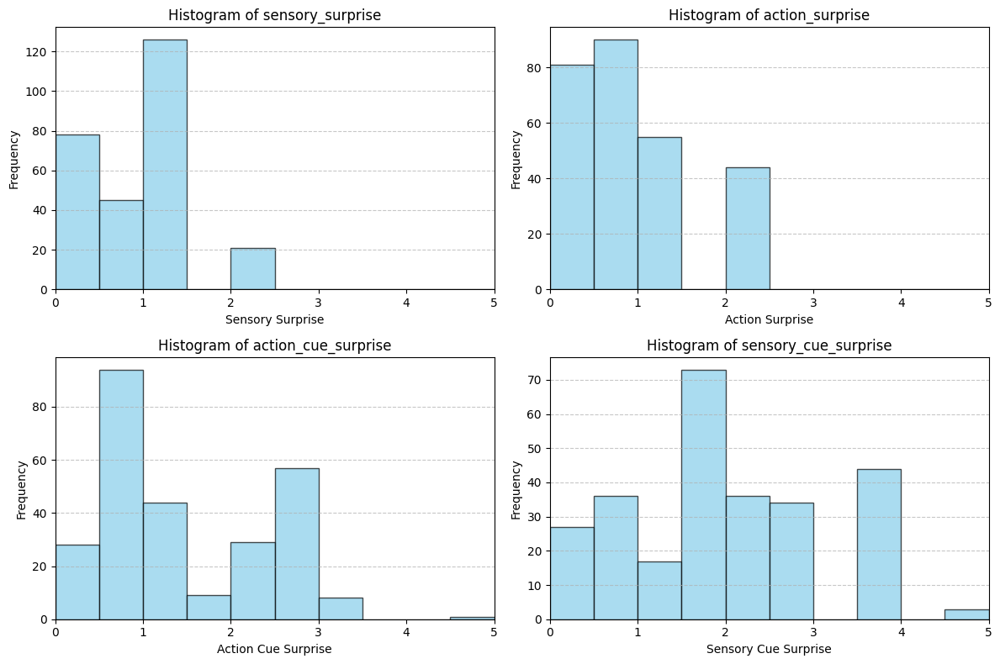

In [372]:
bin_num = 10

columns = ['sensory_surprise', 'action_surprise', 'action_cue_surprise', 'sensory_cue_surprise']
bins = np.linspace(0, 5, bin_num+1)  

plt.figure(figsize=(12, 8))

for i, col in enumerate(columns, 1):
    plt.subplot(2, 2, i)  # Arrange in a 2x2 grid
    plt.hist(panos.log_data[col].dropna(), bins=bins, color='skyblue', edgecolor='black', alpha=0.7)
    plt.xlabel(col.replace('_', ' ').title())
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {col}')
    plt.xlim(0, 5)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


# interpolation function

# Characterize pupil size change

## record interpolation data (pupil size after hearing the sound stimulus) for each trial 

## find max

In [168]:
'''应该interpolate以后'''

'应该interpolate以后'

In [349]:
#whole_exp_trial = list(range(1, 271))
maxPupil_per_trial = []

for i in whole_exp_trial:
    maxPupil = panos.eye_data[(panos.eye_data['trial_index'] == i) & (panos.eye_data['Pupil'].notna())]['Pupil'].max()
    maxPupil_per_trial.append(maxPupil)



In [351]:
len(maxPupil_per_trial)

270

In [352]:
panos.log_data['maxPupil'] = maxPupil_per_trial

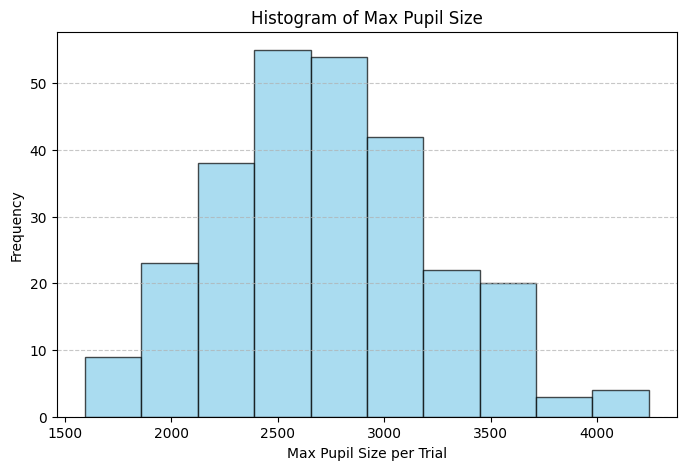

In [363]:

# Plot histogram
plt.figure(figsize=(8, 5))
plt.hist(panos.log_data['maxPupil'].dropna(), color='skyblue', edgecolor='black', alpha=0.7)

# Labels and title
plt.xlabel('Max Pupil Size per Trial')
plt.ylabel('Frequency')
plt.title('Histogram of Max Pupil Size')

# Add grid for readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show plot
plt.show()


## scalar amplitude estimate by projecting on average pupil change (fmri?) 

* can use "By using a separate template per subject, it also accounts for the individual differences in the pupil impulse response function in a data-driven fashion"
* 0.5-2.0 since stimulus onset

before blink process: 1398
row numbers after blink process:  1398
row number after diff filtering:  1094
inner bound: 0.2 outer bound 0.22
before blink process: 1094
row numbers after blink process:  1094
row number after diff filtering:  883
inner bound: 0.1 outer bound 0.11
before blink process: 883
row numbers after blink process:  883
row number after diff filtering:  754
inner bound: 0.1 outer bound 0.11


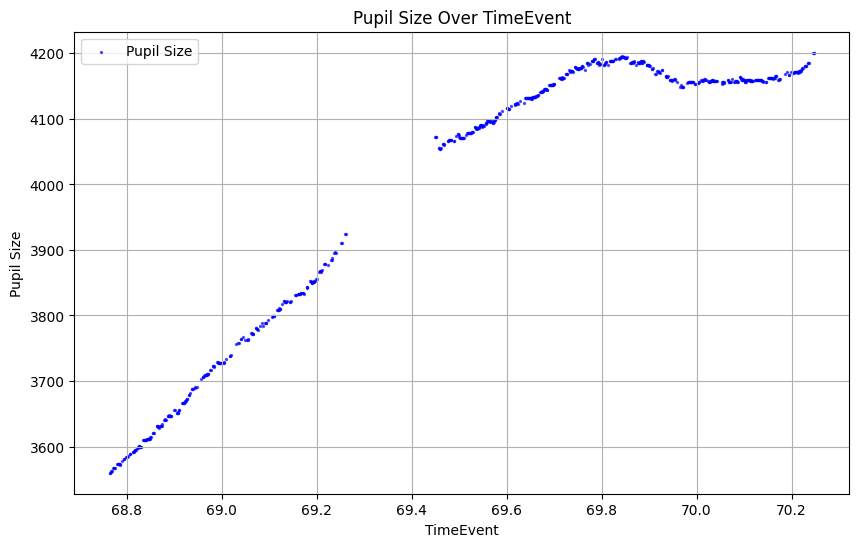

data length 754
Start time: 68.76417419989593
69.44972700001676 69.26172700001666
Raw total missing count: 860
Expected missing: 746
Final total missing: 746 (should match expected missing)


In [57]:

trial_index = 1

''' Determine time bound '''
sound_time = panos_eye[
    (panos_eye['event'].isin(['start decision window'])) & 
    (panos_eye['trial_index'] == trial_index)
]['TimeEvent'].iloc[0]

start_bound = sound_time + 0.5
end_bound = sound_time + 2


''' Find dataset '''
selected_data = panos.eye_data[
    (panos.eye_data['trial_index'] == trial_index) & 
    (panos.eye_data['Pupil'].notna()) & 
    (panos.eye_data['TimeEvent'] >= start_bound) & 
    (panos.eye_data['TimeEvent'] <= end_bound)
]

processed_data = filter_eye_data_diff_blink(selected_data, [trial_index])

#print(start_bound, end_bound)
print("data length", len(processed_data))
''' Determine how many missing for each gap '''
missing_count = []

# Check missing timestamps
if not processed_data.empty:
    current_time = processed_data.iloc[0]['TimeEvent']
    print("Start time:", current_time)
    
    for i in range(len(processed_data) - 1):  
        next_time = processed_data.iloc[i + 1]['TimeEvent']
        gap = next_time - current_time  

        if gap > 0.001:  # If gap is larger than 1 ms
            add = math.ceil(gap / 0.001) - 1  # Count missing points
            if add == 188:
                print(next_time, current_time)
            missing_count.append(add)  # Count missing points
        else:
            missing_count.append(0)

        current_time = next_time  # Move to the next timestamp

# Sum of missing points
raw_total_missing = sum(missing_count)
# print("Raw total missing count:", raw_total_missing)

''' Expected missing '''
expected_missing = 1500 - len(processed_data)
# print(f"Expected missing: {expected_missing}")

''' Determine gaps at the beginning and the end '''
remain_missing = expected_missing - raw_total_missing

if remain_missing > 0:
    # Calculate the gap before the first TimeEvent (before start_bound)
    first_gap = processed_data.iloc[0]['TimeEvent'] - start_bound if not processed_data.empty else 0 
    # Calculate the gap after the last TimeEvent (after end_bound)
    last_gap = end_bound - processed_data.iloc[-1]['TimeEvent'] if not processed_data.empty else 0
    
    # Distribute remaining missing data proportionally
    if first_gap + last_gap > 0:  # Ensure total gap is > 0 to avoid division by zero
        first_missing = round(remain_missing * first_gap / (first_gap + last_gap))
        last_missing = remain_missing - first_missing
        
        # print(f"First gap: {first_gap}, Last gap: {last_gap}")
        # print(f"First missing: {first_missing}, Last missing: {last_missing}")
    else:
        first_missing = 0
        last_missing = 0
        # print("No gaps to fill.") 
    missing_count.insert(0, first_missing)  # Add to the beginning
    missing_count.append(last_missing)  # Add to the end
elif remain_missing == 0:
    first_missing = 0
    last_missing = 0
    # print("No missing data to distribute.")
else: # more missing data than expected
    excessive_missing = abs(remain_missing)
    while excessive_missing > 0:
        # Find the largest gap
        non_zero_indices = [i for i, val in enumerate(missing_count) if val > 0]
        if len(non_zero_indices) >= excessive_missing:
            selected_indices = random.sample(non_zero_indices, excessive_missing)
            
            for i in selected_indices:
                missing_count[i] -= 1
                excessive_missing -= 1
                if excessive_missing == 0:
                    break
    

#print(f"Updated missing count list: {missing_count}")
print(f"Final total missing: {sum(missing_count)} (should match expected missing)")


In [437]:
target_index = processed_data.index[0] if not processed_data.empty else None
first_time_event = processed_data['TimeEvent'].iloc[0] if not processed_data.empty else None
print("First TimeEvent:", first_time_event)
print("target index:", target_index)

First TimeEvent: 68.83517419989585
target index: 3273


In [451]:
if missing_count[0] != 0: # estimate previous pupil size
    # Process the pupil data
    processed_complete_data = filter_eye_data_diff_blink(panos.eye_data, [1])

    # Calculate the reference time
    reference_time = first_time_event - first_gap

    # Find the index of the reference row (the first row where TimeEvent >= reference_time)
    reference_index = processed_complete_data[processed_complete_data['TimeEvent'] >= reference_time].index[0]
    print(reference_index, reference_time)

    selected_rows = processed_complete_data.loc[reference_index - 15 : reference_index - 7]
    selected_rows

    average_pupil_size = selected_rows['Pupil'].mean()


3202 68.76417419989593


,Type,Event,Time,TimeEvent,Offset,trial_index,X,Y,Pupil,event,...,Eye,Start_X,Start_Y,End_X,End_Y,Amplitude,Peak_Velocity,Pupil_diff,TimeEvent_diff,Pupil_derivative
3189,Gaze,NaN,NaN,68.751174,NaN,1,629.3,471.5,3556.0,start decision window,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001,0.0
3190,Gaze,NaN,NaN,68.752174,NaN,1,628.5,472.3,3556.0,start decision window,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,0.001,-2000.0
3191,Gaze,NaN,NaN,68.753174,NaN,1,628.5,472.3,3554.0,start decision window,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,0.001,-2000.0
3192,Gaze,NaN,NaN,68.754174,NaN,1,628.4,472.4,3552.0,start decision window,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.001,1000.0
3193,Gaze,NaN,NaN,68.755174,NaN,1,628.4,472.1,3553.0,start decision window,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001,0.0
3194,Gaze,NaN,NaN,68.756174,NaN,1,629.1,472.1,3553.0,start decision window,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.001,1000.0
3195,Gaze,NaN,NaN,68.757174,NaN,1,629.1,472.3,3554.0,start decision window,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001,0.0


In [ ]:
if missing_count[0] != 0: # estimate previous pupil size

def interpolate_edge_data(data, trial_index, first=True, ):
    # Process the pupil data
    processed_complete_data = filter_eye_data_diff_blink(panos.eye_data, [trial_index])

    
    # Calculate the reference time
    reference_time = first_time_event - first_gap

    # Find the index of the reference row (the first row where TimeEvent >= reference_time)
    reference_index = processed_complete_data[processed_complete_data['TimeEvent'] >= reference_time].index[0]
    print(reference_index, reference_time)

    selected_rows = processed_complete_data.loc[reference_index - 15 : reference_index - 7]
    selected_rows

    average_pupil_size = selected_rows['Pupil'].mean()
    first_row = processed_data.iloc[0]  # Get the first row of processed_data
    first_pupil_size = first_row['Pupil']  # Get the 'Pupil' value from the first row

    # Create an array of evenly spaced values between the first pupil size and the average pupil size
    # np.linspace generates num_missing_points points between first_pupil_size and average_pupil_size
    interpolated_pupil_sizes = np.linspace(average_pupil_size, first_pupil_size, missing_count[0])

    # Print or store the interpolated pupil sizes
    print("Interpolated Pupil Sizes:", interpolated_pupil_sizes)

In [456]:

# Assuming the first row of processed_data and average pupil size are already available
first_row = processed_data.iloc[0]  # Get the first row of processed_data
first_pupil_size = first_row['Pupil']  # Get the 'Pupil' value from the first row

# Create an array of evenly spaced values between the first pupil size and the average pupil size
# np.linspace generates num_missing_points points between first_pupil_size and average_pupil_size
interpolated_pupil_sizes = np.linspace(average_pupil_size, first_pupil_size, missing_count[0])

# Print or store the interpolated pupil sizes
print("Interpolated Pupil Sizes:", interpolated_pupil_sizes)



Interpolated Pupil Sizes: [3554.         3557.11111111 3560.22222222 3563.33333333 3566.44444444
 3569.55555556 3572.66666667 3575.77777778 3578.88888889 3582.
 3585.11111111 3588.22222222 3591.33333333 3594.44444444 3597.55555556
 3600.66666667 3603.77777778 3606.88888889 3610.        ]


In [459]:
# Get the last row of processed_data
last_row = processed_data.iloc[-1]  # Get the last row of processed_data
last_pupil_size = last_row['Pupil']  # Get the 'Pupil' value from the last row

# Get the last time event from the processed_data
last_time_event = processed_data['TimeEvent'].iloc[-1] if not processed_data.empty else None

# Calculate the reference time based on the last time event and last gap
reference_time_last = last_time_event - last_gap

# Find the index of the reference row where TimeEvent >= reference_time
reference_index_last = processed_data[processed_data['TimeEvent'] >= reference_time_last].index[0]
print(f"Reference index: {reference_index_last}, Reference time: {reference_time_last}")

# Select rows from reference_index + 7 to reference_index + 15 (total 9 rows)
# Ensure that the index does not go out of bounds
selected_rows_last = processed_data.loc[reference_index_last + 7 : reference_index_last + 15]

# In case there are fewer rows, adjust the selection
num_rows = len(selected_rows_last)
print(f"Selected rows: {num_rows}")

# If there are fewer than 9 rows, adjust to select as many as possible
if num_rows < 9:
    selected_rows_last = processed_data.loc[reference_index_last + 7 : reference_index_last + 7 + num_rows]

#print(f"Selected rows after adjustment:\n{selected_rows_last}")

# Calculate the average pupil size for the selected rows
average_pupil_size_last = selected_rows_last['Pupil'].mean()
print(f"Average pupil size for selected rows: {average_pupil_size_last}")

# Determine the number of data points to interpolate based on the last entry of missing_count
num_missing_points_last = missing_count[-1]  # The number of missing data points to generate for the last row

# Create an array of evenly spaced values between the last pupil size and the average pupil size
# np.linspace generates num_missing_points_last points between last_pupil_size and average_pupil_size
interpolated_pupil_sizes_last = np.linspace(last_pupil_size, average_pupil_size_last, num_missing_points_last)

# Print or store the interpolated pupil sizes
print("Interpolated Pupil Sizes (for last row):", interpolated_pupil_sizes_last)


Reference index: 4434, Reference time: 70.08927980013732
Selected rows: 6
Average pupil size for selected rows: 4159.0
Interpolated Pupil Sizes (for last row): [4163.         4162.82608696 4162.65217391 4162.47826087 4162.30434783
 4162.13043478 4161.95652174 4161.7826087  4161.60869565 4161.43478261
 4161.26086957 4161.08695652 4160.91304348 4160.73913043 4160.56521739
 4160.39130435 4160.2173913  4160.04347826 4159.86956522 4159.69565217
 4159.52173913 4159.34782609 4159.17391304 4159.        ]


In [511]:
# Initialize the list to hold the new Pupil values after processing
new_pupil_data = []
new_pupil_data.extend(interpolated_pupil_sizes)

# Loop over each index to check gaps
for i in range(len(missing_count[1:-1])):
    # Check if i is not the last index
    if i < len(missing_count) - 1:  # Ensure we don't exceed bounds
        # Check if there is no missing data in the next index
        
        if missing_count[i + 1] == 0:
            # If no missing data, simply take the pupil size from the current row
            current_pupil_value = processed_data.iloc[i]['Pupil']
            new_pupil_data.append(current_pupil_value)
        else:
            # If there is a gap, perform linear interpolation for the missing points
            # print(f"trying to interpolate {missing_count[i+1]}values")
            interpolated_values = np.linspace(
                processed_data.iloc[i]['Pupil'],
                processed_data.iloc[i + 1]['Pupil'],
                missing_count[i+1] + 2  # Including the two bounds (start and end)
            )[:-1]  # Skip the first and last values to avoid duplicating bounds
            #print(interpolated_values)
            new_pupil_data.extend(interpolated_values)
    else:
        # Handle the last index (if there's no next row to interpolate with)
        current_pupil_value = processed_data.iloc[i]['Pupil']
        new_pupil_data.append(current_pupil_value)
    #print(missing_count[i+1], len(new_pupil_data))

# Append the last Pupil value to new_pupil_data
new_pupil_data.append(processed_data.iloc[-1]['Pupil'])

new_pupil_data.extend(interpolated_pupil_sizes_last) 

## interpolation function

In [293]:
def find_missing_count(processed_event_data, start_bound, end_bound):


    ''' Determine how many missing for each gap '''
    missing_count = []

    # Check missing timestamps
    current_time = processed_event_data.iloc[0]['TimeEvent']
    # print("Start time:", current_time)
    
    for i in range(len(processed_event_data) - 1):  
        next_time = processed_event_data.iloc[i + 1]['TimeEvent']
        gap = next_time - current_time  

        if gap > 0.001:  # If gap is larger than 1 ms
            add = math.ceil(gap / 0.001) - 1  # Count missing points
            missing_count.append(add)  # Count missing points
        else:
            missing_count.append(0)

        current_time = next_time  # Move to the next timestamp

    # Sum of missing points
    raw_total_missing = sum(missing_count)
    # print("Raw total missing count:", raw_total_missing)

    ''' Expected missing '''
    expected_missing = 1500 - len(processed_event_data)
    # print(f"Expected missing: {expected_missing}")

    ''' Determine gaps at the beginning and the end '''
    remain_missing = expected_missing - raw_total_missing

    if remain_missing > 0:
        # Calculate the gap before the first TimeEvent (before start_bound)
        first_gap = processed_event_data.iloc[0]['TimeEvent'] - start_bound if not processed_event_data.empty else 0 
        # Calculate the gap after the last TimeEvent (after end_bound)
        last_gap = end_bound - processed_event_data.iloc[-1]['TimeEvent'] if not processed_event_data.empty else 0
        
        # Distribute remaining missing data proportionally
        if first_gap + last_gap > 0:  # Ensure total gap is > 0 to avoid division by zero
            first_missing = round(remain_missing * first_gap / (first_gap + last_gap))
            last_missing = remain_missing - first_missing
            
            # print(f"First gap: {first_gap}, Last gap: {last_gap}")
            # print(f"First missing: {first_missing}, Last missing: {last_missing}")
    elif remain_missing < 0: # more missing data than expected
        excessive_missing = abs(remain_missing)
        while excessive_missing > 0:
            # Find the largest gap
            non_zero_indices = [i for i, val in enumerate(missing_count) if val > 0]
            if len(non_zero_indices) >= excessive_missing:
                selected_indices = random.sample(non_zero_indices, excessive_missing)
                
                for i in selected_indices:
                    missing_count[i] -= 1
                    excessive_missing -= 1
                    if excessive_missing == 0:
                        break
        first_missing = last_missing = 0
    
    missing_count.insert(0, first_missing)
    missing_count.append(last_missing)

    # print("length of missing_count is ",len(missing_count))
        
    if sum(missing_count) != expected_missing:
        raise ValueError(f"Mismatch in missing count: Got {sum(missing_count)}, expected {expected_missing} for trial {trial_index}.")
    

    return missing_count


In [332]:

def interpolate_edge_data(processed_event_data, processed_trial_data, missing_count, gap, first=True):
    """
    Interpolates missing pupil data for the first or last gap of a trial.

    Parameters:
        data (DataFrame): The processed pupil data containing 'TimeEvent' and 'Pupil' columns.
        trial_index (int): The trial index used to fetch first/last time events and gaps.
        missing_count (list): A list containing the number of missing data points.
        first (bool): If True, processes the first gap; if False, processes the last gap.

    Returns:
        np.ndarray: The interpolated pupil size values.
    """

    # print("missing_count", missing_count)

    checked_row = 0 if first else -1
    target_index = processed_event_data.index[checked_row]
    time_event = processed_event_data['TimeEvent'].iloc[checked_row]

    # Get time event and gap values
    reference_time = time_event + gap if first else time_event - gap

    # Find the reference index
    reference_index = processed_trial_data[processed_trial_data['TimeEvent'] >= reference_time].index[0]

    reference_row_position = processed_trial_data.index.get_loc(reference_index)  # Get position of reference index


    # Select rows based on whether it's the first or last gap
    if first:
        selected_rows = processed_trial_data.iloc[reference_row_position - 15 : reference_row_position - 7]
    else:
        selected_rows = processed_event_data.iloc[reference_row_position + 7 : reference_row_position + 15]

    # print("checking selected_rows", selected_rows)
    # Compute the average pupil size
    average_pupil_size = selected_rows['Pupil'].mean()
  
    # Get the first or last pupil size
    if first:
        edge_pupil_size = processed_trial_data.iloc[0]['Pupil']
        num_missing_points = missing_count[0] 
    else:
        edge_pupil_size = processed_trial_data.iloc[-1]['Pupil']
        num_missing_points = missing_count[-1]

    # Generate interpolated values
    if num_missing_points == 1:
        interpolated_pupil_sizes = np.array([average_pupil_size])
    else:
        # print("average pupil size", average_pupil_size, "edge pupil size", edge_pupil_size)
        if first:
            interpolated_pupil_sizes = np.linspace(average_pupil_size, edge_pupil_size, num_missing_points+2)[1:-1]
        else:
            interpolated_pupil_sizes = np.linspace(edge_pupil_size, average_pupil_size, num_missing_points+2)[1:-1]
    # print("interpolated_pupil_sizes", interpolated_pupil_sizes)


    return interpolated_pupil_sizes


In [136]:


def interpolate_middle_part(new_pupil_data, missing_count, processed_event_data):
    # Loop over each index to check gaps, ensuring correct range
    for i in range(1, len(missing_count)-1):  # Iterate over all valid indices
        if missing_count[i] != 0: 
            # Perform linear interpolation for missing values
            interpolated_values = np.linspace(processed_event_data.iloc[i-1]['Pupil'], processed_event_data.iloc[i]['Pupil'], missing_count[i]+2)[1:-1]  # Remove first & last to avoid duplication
            new_pupil_data.extend(interpolated_values)
        current_pupil_value = processed_event_data.iloc[i]['Pupil']
        new_pupil_data.append(current_pupil_value)

    return new_pupil_data



In [346]:
def interpolate_pupil_data (data, trial_index, event = "sound", plot = False):
    trial_data = data[(data['trial_index'] == trial_index)& data['Pupil'].notna()]

    ''' Determine time bound '''
    if event =="sound":
        try:
            # Remove NaN values from the 'TimeEvent' column and get the first non-NaN value
            event_time = trial_data[trial_data['event'] == 'start decision window'].dropna(subset=['TimeEvent'])['TimeEvent'].iloc[0]
        except IndexError:
            # Handle the case where there are no non-NaN values
            raise ValueError("No valid 'TimeEvent' found in the trial data.") 
    else:
        print(f"event {event} is not defined")
    
    processed_trial_data = filter_eye_data_diff_blink(trial_data, [trial_index], plot= False)
    # print(processed_trial_data)
    
    start_bound = event_time+0.5
    end_bound = event_time +2

    ''' Find processed event dataset '''
    processed_event_data = processed_trial_data[
        (processed_trial_data['TimeEvent'] >= start_bound) & 
        (processed_trial_data['TimeEvent'] <= end_bound)
    ]

    if processed_event_data.empty:
        raise ValueError("Error: processed_event_data is empty. Check filtering conditions.")


    missing_count = find_missing_count(processed_event_data, start_bound, end_bound)

    # Initialize the list to hold the new Pupil values after processing
    new_pupil_data = []
    '''interpolating data for the first gap'''
    if missing_count[0] !=0:
        first_gap = processed_event_data.iloc[0]['TimeEvent'] - (event_time + 0.5)
        interpolation_first = interpolate_edge_data(processed_event_data, processed_trial_data, missing_count, first_gap)
        # print(f"expected to interpolate {missing_count[0]}, found {len(interpolation_first)}")
        if np.isnan(interpolation_first).any():
            raise ValueError("Interpolated first data contains NaN values!")
        new_pupil_data.extend(interpolation_first)
    new_pupil_data.append(processed_event_data.iloc[0]['Pupil'])
    # print(f"Recorded {len(new_pupil_data)} data in total after interpolating the first gap")

    # print("interpolating the middle part...")
    interpolate_middle_part(new_pupil_data, missing_count, processed_event_data)
    # print(f"Get {len(middle_pupil_interpolation)} pupil data after the middle part interpolation")
   
    if missing_count[-1] !=0:
        #new_pupil_data.append(processed_event_data.iloc[-1]['Pupil'])
        # print("interpolating data for the last gap")
        last_gap = (event_time + 2) - processed_data.iloc[-1]['TimeEvent']
        interpolation_last= interpolate_edge_data(processed_event_data, processed_trial_data, missing_count, last_gap, first=False)
        if np.isnan(interpolation_last).any():
            raise ValueError("Interpolated last data contains NaN values!")
        new_pupil_data.extend(interpolation_last)

        # print(f"expected to interpolate {missing_count[-1]}, found {len(interpolation_last)}")

    # print(f"Recorded {len(new_pupil_data)} data in total after interpolating the last gap")

    new_pupil_data=np.array(new_pupil_data)
    if np.isnan(new_pupil_data).any():
        # print(new_pupil_data)
        raise ValueError("Interpolated pupil data contains NaN values!")
    if len(new_pupil_data) != 1500:
        raise ValueError(f"Expected 1500 pupil data points, but got {len(new_pupil_data)} after interpolation.")
    # check if new_pupil_data has nan

# Create a figure with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(10, 3))  # 3 rows, 1 column of subplots

    # First subplot
    axes[0].scatter(processed_trial_data['TimeEvent'], processed_trial_data['Pupil'], color='blue', alpha=0.6, s=3)
    axes[0].set_title(f"Processed Trial Data - Trial {processed_trial_data['trial_index'].iloc[0]}")
    axes[0].set_xlabel('TimeEvent')
    axes[0].set_ylabel('Pupil Size')
    axes[0].grid(True)

    # Second subplot
    axes[1].scatter(processed_event_data['TimeEvent'], processed_event_data['Pupil'], color='green', alpha=0.6, s=3)
    axes[1].set_title(f"Processed Event Data - Trial {processed_event_data['trial_index'].iloc[0]}")
    axes[1].set_xlabel('TimeEvent')
    axes[1].set_ylabel('Pupil Size')
    axes[1].grid(True)

    index = np.arange(len(new_pupil_data))  # Create an index based on the length of new_pupil_data_2

    # Third subplot
    axes[2].scatter(index, new_pupil_data, color='blue', alpha=0.7, s=3)  # Plot index vs pupil size
    axes[2].set_xlabel('TimeEvent')
    axes[2].set_ylabel('Pupil Size')
    # axes[2].grid(True)

    # Adjust layout for better spacing
    plt.tight_layout()

    # Show the plot
    plt.show()

    return new_pupil_data


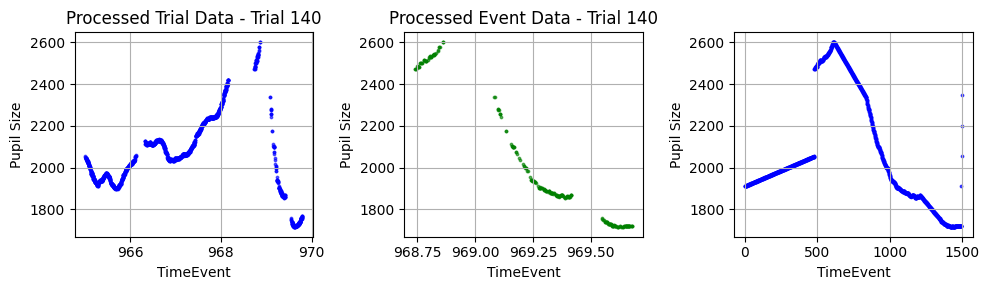

array([1911.29791667, 1911.59583333, 1911.89375   , ..., 2056.55      ,
       2201.325     , 2346.1       ])

In [341]:
interpolate_pupil_data(panos.eye_data, 140)


In [166]:
type(new_pupil_data_2)

list

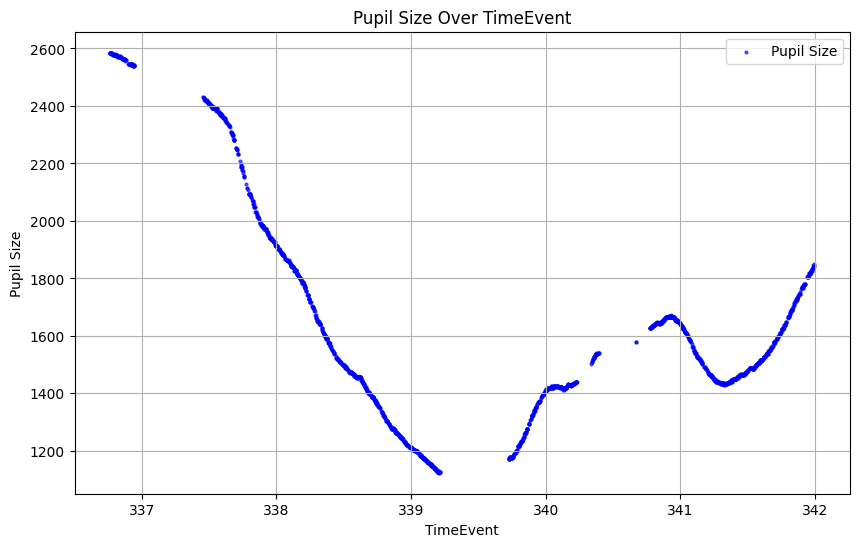

,Type,Event,Time,TimeEvent,Offset,trial_index,X,Y,Pupil,event,...,Eye,Start_X,Start_Y,End_X,End_Y,Amplitude,Peak_Velocity,Pupil_diff,TimeEvent_diff,Pupil_derivative
218969,Gaze,NaN,NaN,336.761470,NaN,45,659.8,506.7,2583.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.001,2000.0
218970,Gaze,NaN,NaN,336.762470,NaN,45,660.1,506.7,2585.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001,0.0
218971,Gaze,NaN,NaN,336.763470,NaN,45,660.3,506.7,2585.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001,0.0
218972,Gaze,NaN,NaN,336.764470,NaN,45,660.0,506.6,2585.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001,0.0
218973,Gaze,NaN,NaN,336.765470,NaN,45,659.7,506.7,2585.0,start recording,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223863,Gaze,NaN,NaN,341.985599,NaN,45,707.5,468.5,1839.0,response,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.001,1000.0
223867,Gaze,NaN,NaN,341.989599,NaN,45,707.2,468.6,1845.0,response,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,0.001,-1000.0
223868,Gaze,NaN,NaN,341.990599,NaN,45,707.1,468.5,1844.0,response,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,0.001,-1000.0
223869,Gaze,NaN,NaN,341.991599,NaN,45,707.1,468.7,1843.0,response,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.001,0.0


In [246]:
filter_eye_data_diff_blink(panos.eye_data,[45],rep=3,plot=True)

processed trial, event data length 2683 753


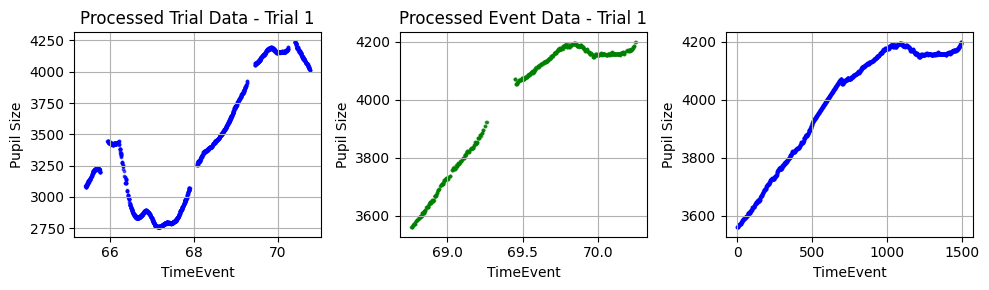

In [334]:
new_pupil_data_100= interpolate_pupil_data(panos.eye_data, 1, plot=True)



In [315]:

# Assuming new_pupil_data_2 is a numpy array (if it's a list, convert it to numpy array first)
new_pupil_data_100 = np.array(new_pupil_data_100)  # Ensure it's a numpy array if it's not already

# Find the NaN values in the array
nan_values = np.isnan(new_pupil_data_100)

# Get the indices of the NaN values
nan_indices = np.where(nan_values)

# Print the indices where NaN values are found
print("Indices with NaN values:", nan_indices)

# To get the actual NaN values (if needed)
nan_data = new_pupil_data_100[nan_values]
print("NaN values:", nan_data)


NameError: name 'new_pupil_data_100' is not defined

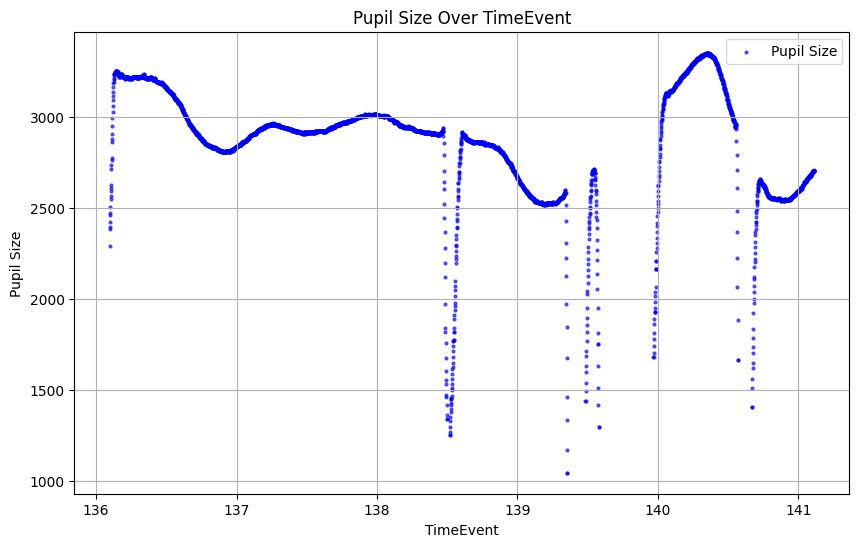

,Type,Event,Time,TimeEvent,Offset,trial_index,X,Y,Pupil,event,Start,End,Duration,Eye,Start_X,Start_Y,End_X,End_Y,Amplitude,Peak_Velocity
65678,Message,initialize,1130.480,136.037273,0.0,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65679,Message,start recording,1130.480,136.037473,0.0,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65680,Blink,NaN,NaN,NaN,NaN,15,NaN,NaN,NaN,start recording,136.044473,136.095473,0.052,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65681,Gaze,NaN,NaN,136.096473,NaN,15,552.1,1032.3,2293.0,start recording,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65682,Gaze,NaN,NaN,136.097473,NaN,15,552.1,1032.3,2384.0,start recording,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70084,Message,done,1135.555,141.111472,0.0,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
70085,Gaze,NaN,NaN,141.111472,NaN,15,646.5,475.7,2703.0,done,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
70086,Gaze,NaN,NaN,141.112472,NaN,15,646.4,476.1,2703.0,done,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
70087,Fixation,NaN,NaN,NaN,NaN,15,648.6,475.8,2593.0,done,140.708472,141.112472,0.405,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [208]:
filter_eye_data_diff_blink(panos.eye_data,[15], rep=0, plot=True)

In [83]:
print(type(new_pupil_data_2))  # Check if it's a list
print(len(new_pupil_data_2))  # Length of the list
print([type(x) for x in new_pupil_data_2])  # Check types of elements
print(new_pupil_data_2[:5])  # Print the first few elements


<class 'tuple'>
2
[<class 'list'>, <class 'list'>]
([1, 0, 0, 0, 0, 0, 9, 4, 0, 0, 0, 0, 0, 0, 0, 6, 0, 7, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 5, 0, 7, 0, 0, 0, 2, 0, 0, 0, 1, 0, 5, 0, 0, 2, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 1, 0, 1, 6, 0, 0, 0, 0, 0, 0, 0, 1, 7, 1, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 7, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 1, 3, 2, 0, 0, 0, 0, 8, 0, 0, 0, 6, 2, 0, 0, 4, 0, 0, 0, 0, 9, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 3, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 3, 0, 0, 4, 2, 0, 0, 0, 4, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 4, 0, 0, 0, 0, 0, 12, 190, 0, 0, 0, 0, 0, 6, 2, 0, 0, 0, 0, 0, 12, 3, 6, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 1, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 3, 4, 0, 3, 6, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 1, 0, 0, 1, 4, 0, 0, 2, 1, 2, 0, 0, 0, 0, 3, 0, 0

In [ ]:
all_pupil_data_sound_raw = np.zeros((num_trials, num_data_points_per_trial))




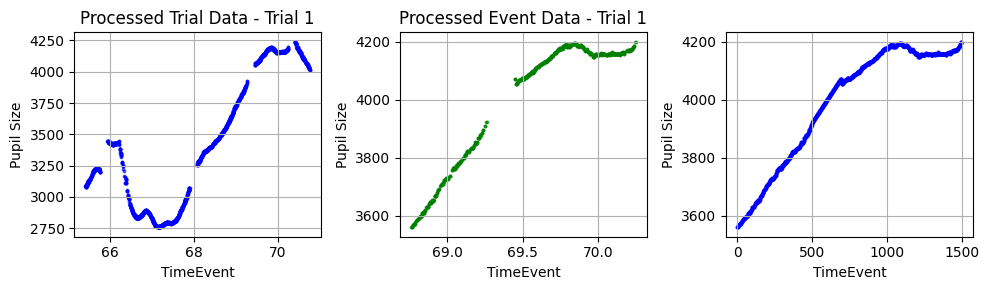

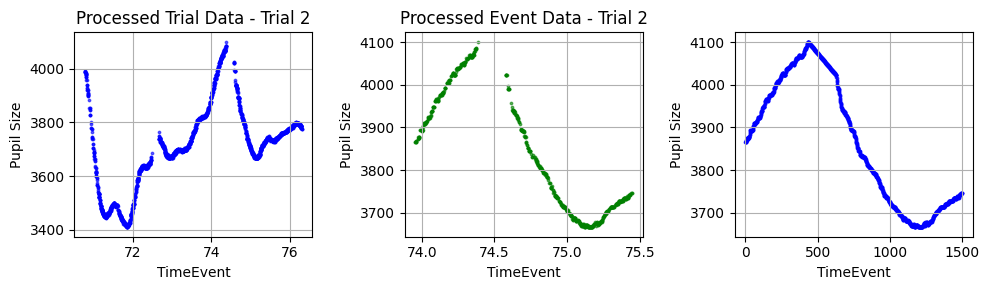

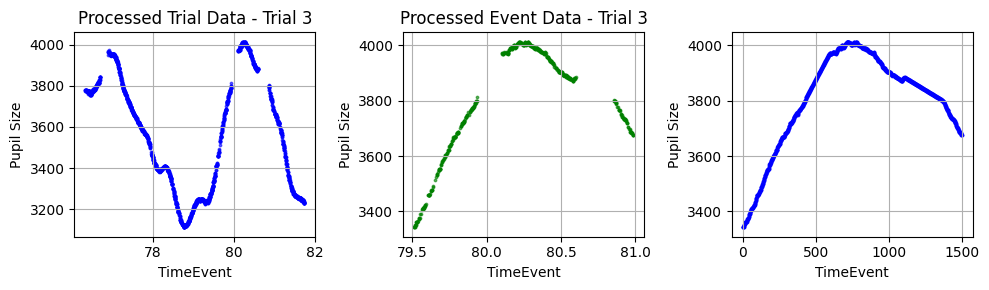

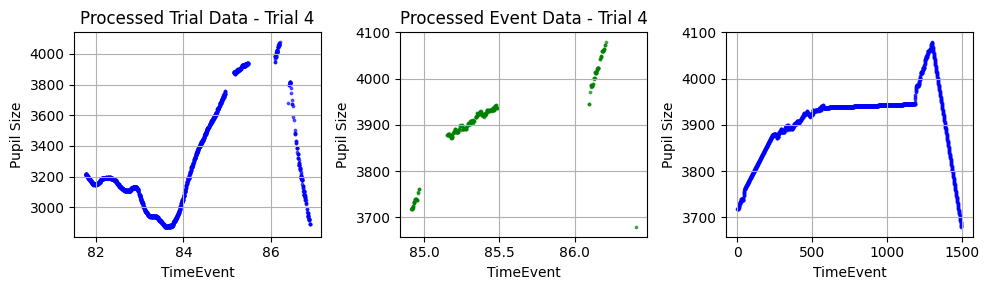

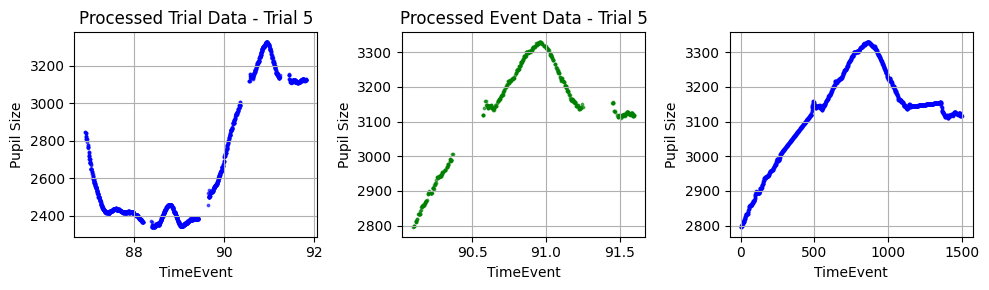

...

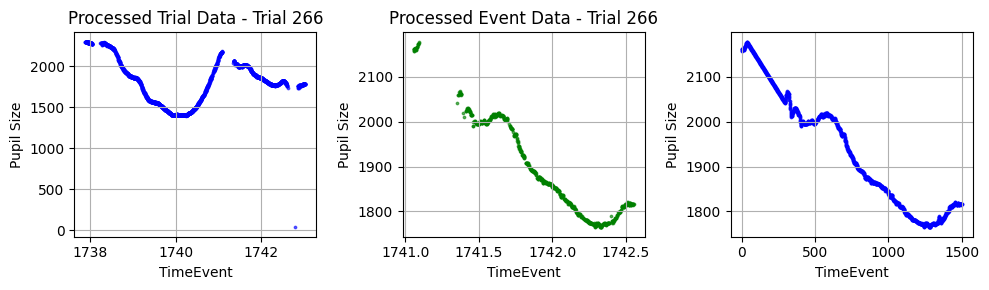

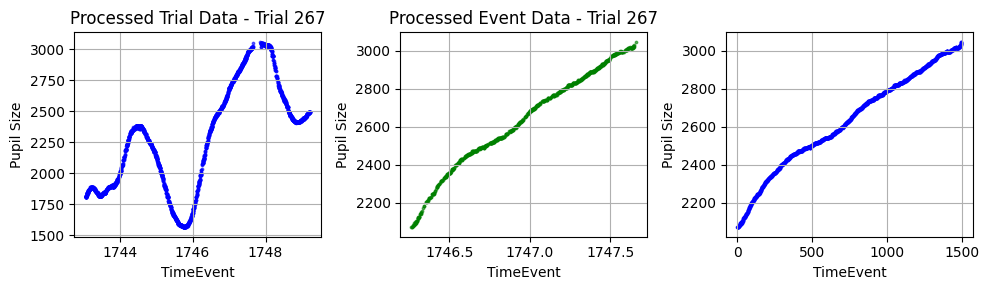

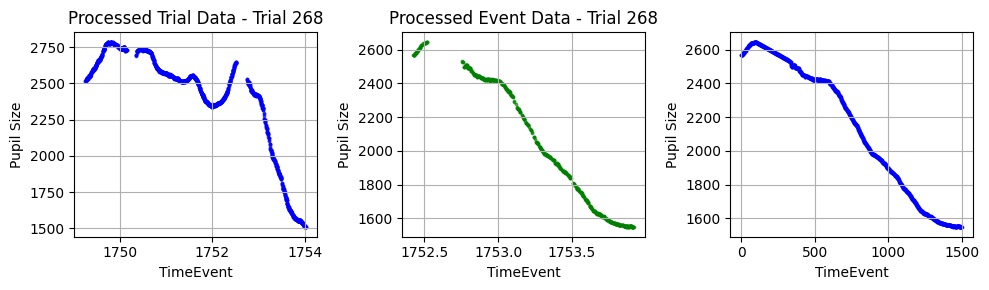

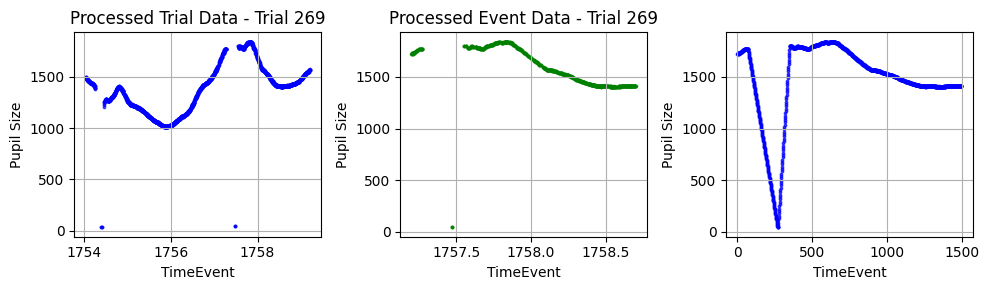

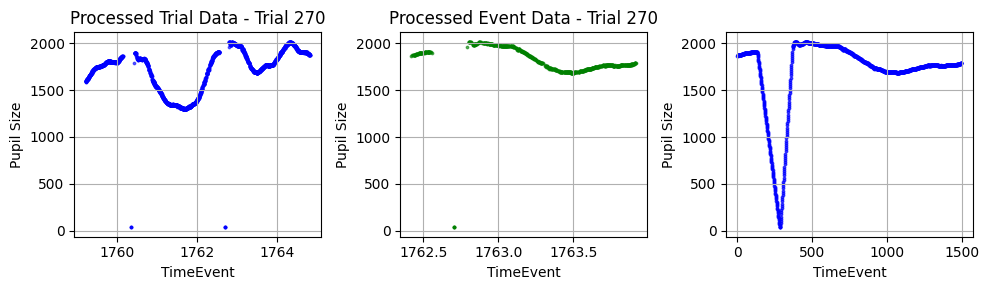

In [336]:

# Assuming you know the number of data points per trial
num_trials = 270
num_data_points_per_trial = 1500  # Example, adjust as needed

# Create an empty 2D array with shape (num_trials, num_data_points_per_trial)
all_pupil_data_sound = np.zeros((num_trials, num_data_points_per_trial))

# Iterate over each trial
for trial_index in range(1,num_trials+1):
    # print("processing trial:", trial_index)
    interpolated_data = interpolate_pupil_data(panos.eye_data, trial_index)
    all_pupil_data_sound[trial_index-1] = interpolated_data  # Store the interpolated data for each trial


In [ ]:
45, 51, 52,56,57,61,69,74,89,90,91,121, 125, 129

# get max

In [342]:
panos.eye_data['event'].unique()

array([nan, 'start recording', 'start', 'show fixation', 'show cue',
       'start decision window', 'response', 'done', 'start sound'],
      dtype=object)

In [355]:


num_trials = 270
pupil_statistics_raw = np.zeros((num_trials, 3, 2))

for trial_index in range(1, num_trials + 1):
    trial_data = panos.eye_data[
        (panos.eye_data['trial_index'] == trial_index) & 
        panos.eye_data['Pupil'].notna()
    ].copy()

    processed_trial_data = filter_eye_data_diff_blink(trial_data, [trial_index], plot=False)

    ''' Determine time bound '''
    events = ['cue', 'sound', 'response']
    for event in events:
        if event == 'sound':
            label = 'start decision window'
            event_num = 1
        elif event == 'cue':
            label = 'show cue'
            event_num = 0
        elif event == 'response':
            label = 'response'
            event_num = 2

        try:
            event_time = trial_data[trial_data['event'] == label].dropna(subset=['TimeEvent'])['TimeEvent'].iloc[0]
        except IndexError:
            raise ValueError(f"No valid 'TimeEvent' found in trial {trial_index} for event {event}.")
    
        # print("event_time", event_time)
        start_bound = event_time + 0.5
        end_bound = event_time + 2
        # print("start, end bound",start_bound, end_bound)

        ''' Find processed event dataset '''
        processed_event_data = processed_trial_data[
            (processed_trial_data['TimeEvent'] >= start_bound) & 
            (processed_trial_data['TimeEvent'] <= end_bound)
        ]

        # print("last recorded data", processed_event_data['TimeEvent'].iloc[-1])

        if processed_event_data.empty:
            raise ValueError(f"Error: processed_event_data is empty for trial {trial_index} and event {event}. Check filtering conditions.")

        pupil_max = processed_event_data['Pupil'].max()
        pupil_mean = processed_event_data['Pupil'].mean()

        pupil_statistics_raw[trial_index - 1, event_num, 0] = pupil_max
        pupil_statistics_raw[trial_index - 1, event_num, 1] = pupil_mean

# pupil_statistics_raw


In [358]:
pupil_raw_sound_max = pupil_statistics_raw[:,1,0]

In [382]:


keys = ['action_surprise', 'sensory_surprise', 'action_cue_surprise', 'sensory_cue_surprise']
num_surpise_models = len(keys)
num_trials = 270

trial_surprise =  np.zeros((num_trials, num_surpise_models))
for index, key in enumerate(keys): 
    trial_surprise[:, index] = panos.log_data[key]


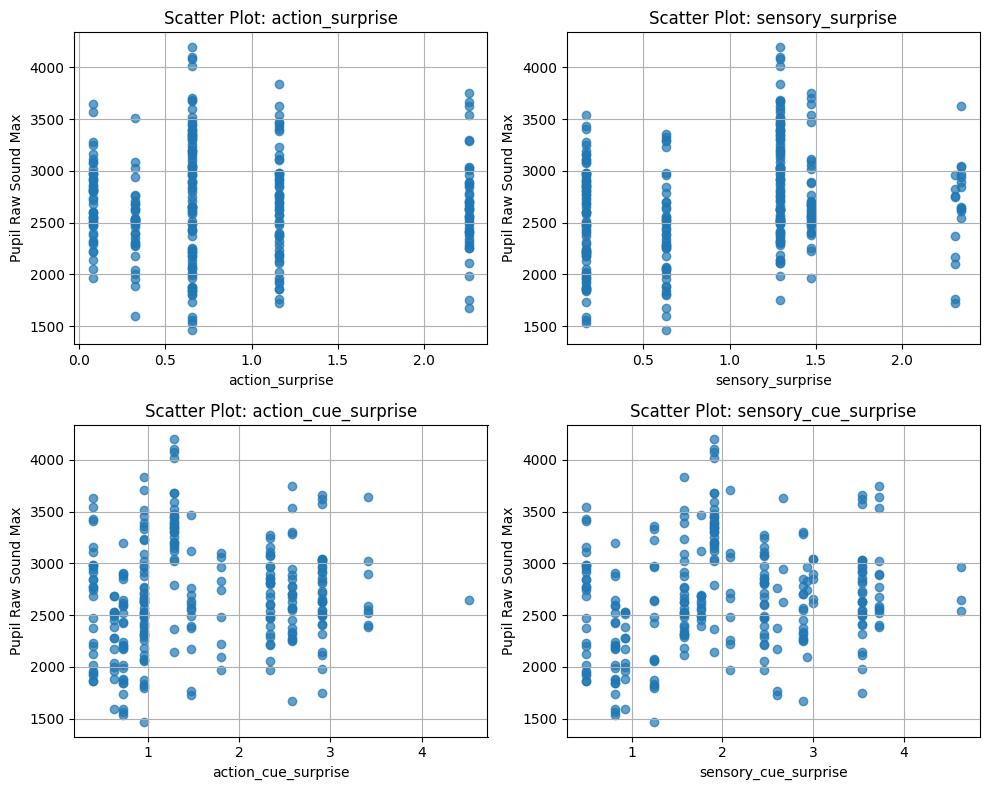

In [383]:
pupil_raw_sound_max = pupil_statistics_raw[:,1,0]

fig, axes = plt.subplots(2, 2, figsize=(10, 8))  # 2 rows, 2 columns

for i, ax in enumerate(axes.flat):  # Flatten the 2D array of axes for easy iteration
    ax.scatter(trial_surprise[:, i], pupil_raw_sound_max, alpha=0.7)
    ax.set_xlabel(f"{keys[i]}")
    ax.set_ylabel("Pupil Raw Sound Max")
    ax.set_title(f"Scatter Plot: {keys[i]}")
    ax.grid(True)

plt.tight_layout()  # Adjust spacing for better readability
plt.show()

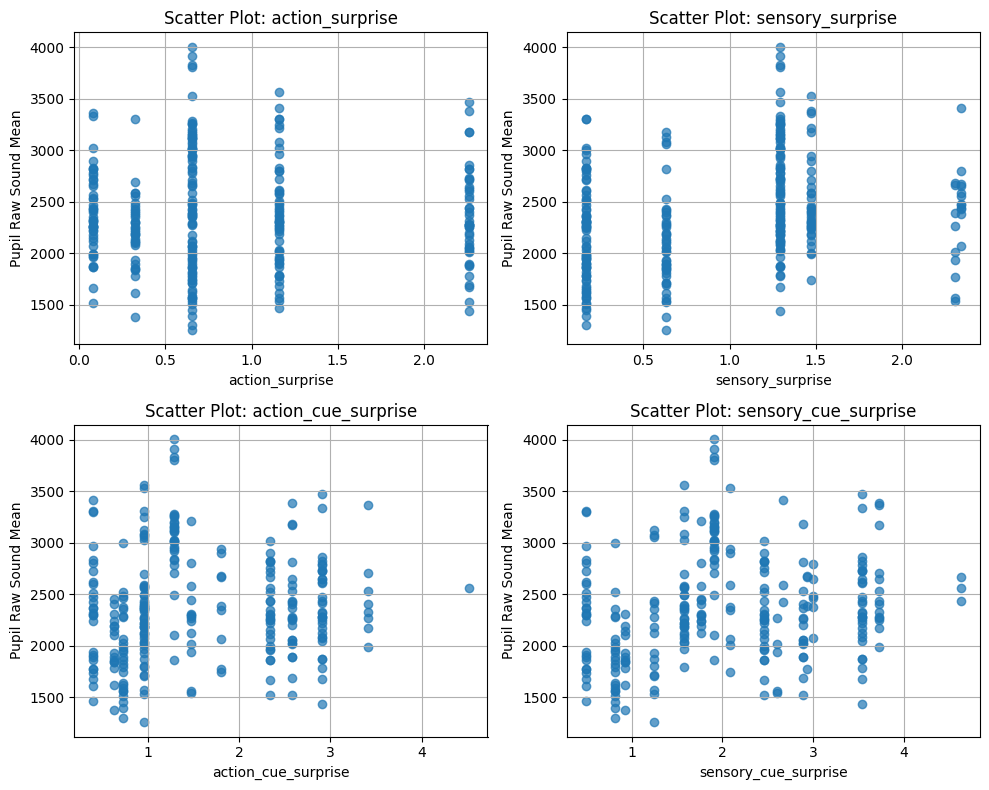

In [386]:
pupil_raw_sound_mean= pupil_statistics_raw[:,1,1]

fig, axes = plt.subplots(2, 2, figsize=(10, 8))  # 2 rows, 2 columns

for i, ax in enumerate(axes.flat):  # Flatten the 2D array of axes for easy iteration
    ax.scatter(trial_surprise[:, i], pupil_raw_sound_mean, alpha=0.7)
    ax.set_xlabel(f"{keys[i]}")
    ax.set_ylabel("Pupil Raw Sound Mean")
    ax.set_title(f"Scatter Plot: {keys[i]}")
    ax.grid(True)

plt.tight_layout()  # Adjust spacing for better readability
plt.show()

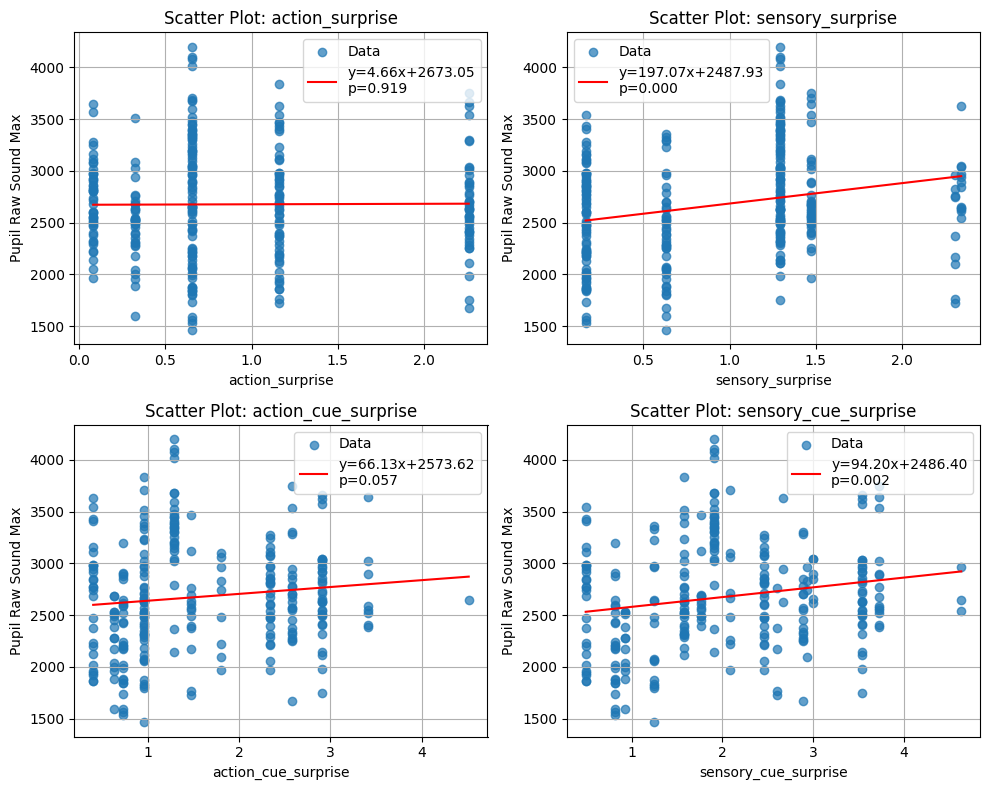

In [388]:

fig, axes = plt.subplots(2, 2, figsize=(10, 8))  # Create 2x2 subplot grid

for i, ax in enumerate(axes.flat):  
    x = trial_surprise[:, i]
    y = pupil_raw_sound_max

    # Scatter plot
    ax.scatter(x, y, alpha=0.7, label="Data")

    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)

    # Plot regression line
    x_vals = np.linspace(min(x), max(x), 100)
    y_vals = slope * x_vals + intercept
    ax.plot(x_vals, y_vals, color='red', label=f"y={slope:.2f}x+{intercept:.2f}\np={p_value:.3f}")

    # Labels and title
    ax.set_xlabel(f"{keys[i]}")
    ax.set_ylabel("Pupil Raw Sound Max")
    ax.set_title(f"Scatter Plot: {keys[i]}")
    ax.legend()
    ax.grid(True)

plt.tight_layout()  # Adjust layout for readability
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))  # Create 2x2 subplot grid

for i, ax in enumerate(axes.flat):  # Loop through each subplot
    # Scatter plot
    ax.scatter(trial_surprise[:, i], pupil_raw_sound_max, alpha=0.7, label="Data")

    # Perform linear regression
    slope, intercept = np.polyfit(trial_surprise[:, i], pupil_raw_sound_max, 1)  # Linear fit (degree=1)
    reg_line = np.poly1d((slope, intercept))  # Create regression function

    # Plot regression line
    x_vals = np.linspace(min(trial_surprise[:, i]), max(trial_surprise[:, i]), 100)
    ax.plot(x_vals, reg_line(x_vals), color='red', label=f"y={slope:.2f}x+{intercept:.2f}")

    # Labels and title
    ax.set_xlabel(f"{keys[i]}")
    ax.set_ylabel("Pupil Raw Sound Max")
    ax.set_title(f"Scatter Plot: {keys[i]}")
    ax.legend()
    ax.grid(True)

plt.tight_layout()  # Adjust layout for better readability
plt.show()

                      action_surprise  sensory_surprise  action_cue_surprise  \
action_surprise              1.000000          0.102358             0.257713   
sensory_surprise             0.102358          1.000000             0.300703   
action_cue_surprise          0.257713          0.300703             1.000000   
sensory_cue_surprise         0.267619          0.560870             0.918541   

                      sensory_cue_surprise  
action_surprise                   0.267619  
sensory_surprise                  0.560870  
action_cue_surprise               0.918541  
sensory_cue_surprise              1.000000  


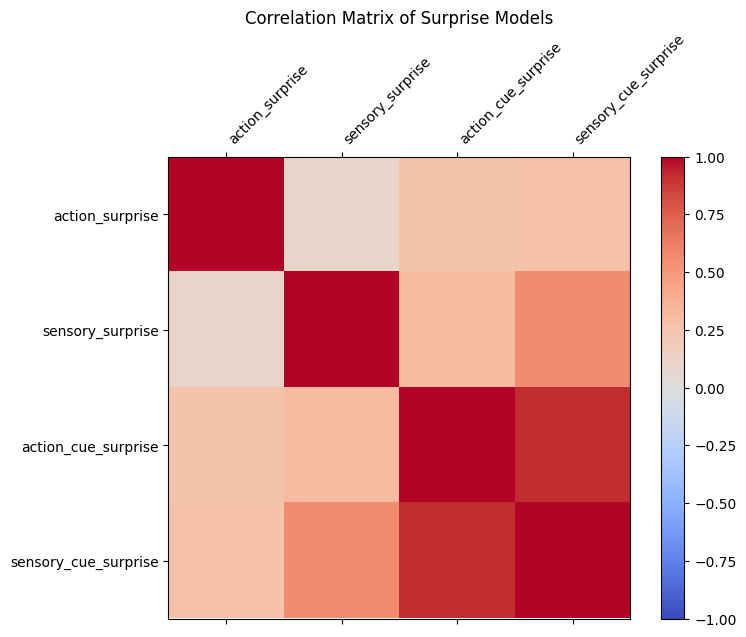

In [392]:


df_surprise = pd.DataFrame(trial_surprise, columns=keys)
# Compute correlation matrix
corr_matrix = df_surprise.corr()

# Print correlation matrix
print(corr_matrix)

# Matplotlib heatmap
fig, ax = plt.subplots(figsize=(8, 6))
cax = ax.matshow(corr_matrix, cmap="coolwarm", vmin=-1, vmax=1)
fig.colorbar(cax)

# Set axis labels
ax.set_xticks(range(len(keys)))
ax.set_yticks(range(len(keys)))
ax.set_xticklabels(keys, rotation=45, ha="left")
ax.set_yticklabels(keys)

plt.title("Correlation Matrix of Surprise Models")
plt.show()


In [399]:
import statsmodels.api as sm

# Create DataFrame with only the selected columns (sensory_surprise, sensory_cue_surprise)
df_selected = df_surprise[['sensory_surprise']]

# Dependent variable (pupil response)
y = pupil_raw_sound_max  

# Add constant term for intercept in regression
X = sm.add_constant(df_selected)  

# Fit Ordinary Least Squares (OLS) regression
model = sm.OLS(y, X).fit()

# Print regression summary
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     16.58
Date:                Tue, 04 Mar 2025   Prob (F-statistic):           6.15e-05
Time:                        14:05:29   Log-Likelihood:                -2067.0
No. Observations:                 270   AIC:                             4138.
Df Residuals:                     268   BIC:                             4145.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             2487.9326     55.985  

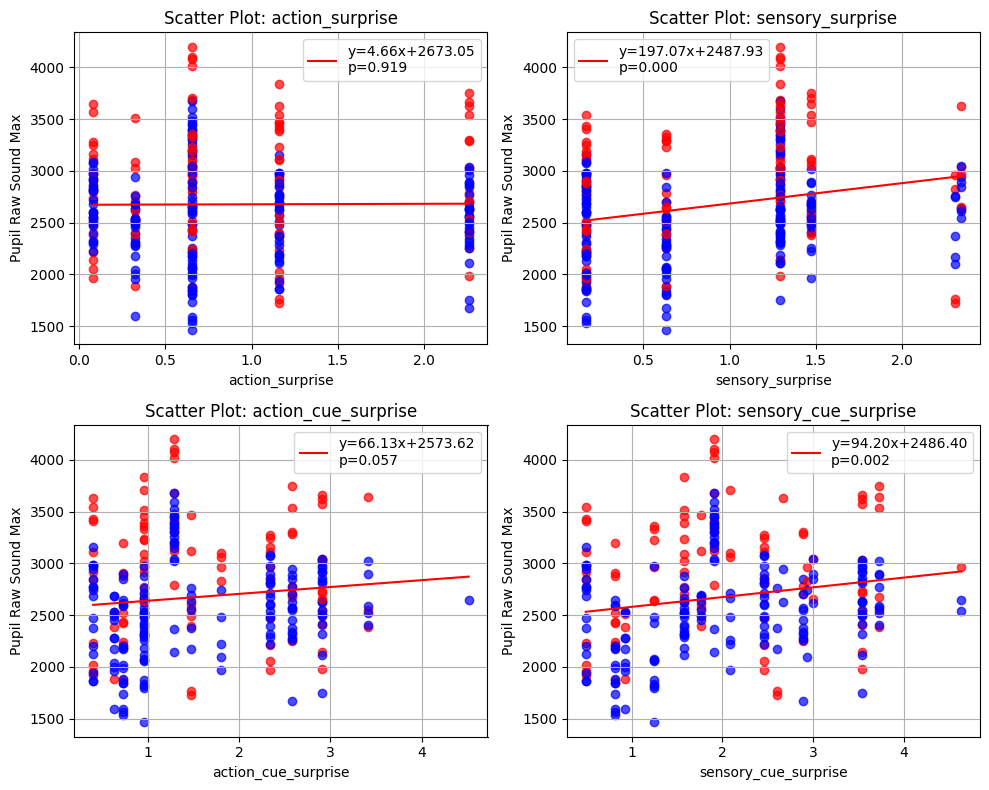

In [400]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Assuming trial_surprise, pupil_raw_sound_max, and keys are already defined

fig, axes = plt.subplots(2, 2, figsize=(10, 8))  # Create 2x2 subplot grid

# Define the index ranges
index_ranges = [(0, 10), (30, 40), (60, 70), (90, 100), (120, 130), (150, 160), (180, 190), (210, 220), (240, 250)]

for i, ax in enumerate(axes.flat):  
    x = trial_surprise[:, i]
    y = pupil_raw_sound_max

    # Scatter plot with different colors based on index range
    for idx in range(len(x)):
        if any(start <= idx <= end for start, end in index_ranges):  # Check if index is in range
            ax.scatter(x[idx], y[idx], color='red', alpha=0.7)  # Red dots for specific index ranges
        else:
            ax.scatter(x[idx], y[idx], color='blue', alpha=0.7)  # Blue dots for others

    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = linregress(x, y)

    # Plot regression line
    x_vals = np.linspace(min(x), max(x), 100)
    y_vals = slope * x_vals + intercept
    ax.plot(x_vals, y_vals, color='red', label=f"y={slope:.2f}x+{intercept:.2f}\np={p_value:.3f}")

    # Labels and title
    ax.set_xlabel(f"{keys[i]}")
    ax.set_ylabel("Pupil Raw Sound Max")
    ax.set_title(f"Scatter Plot: {keys[i]}")
    ax.legend()
    ax.grid(True)

plt.tight_layout()  # Adjust layout for readability
plt.show()


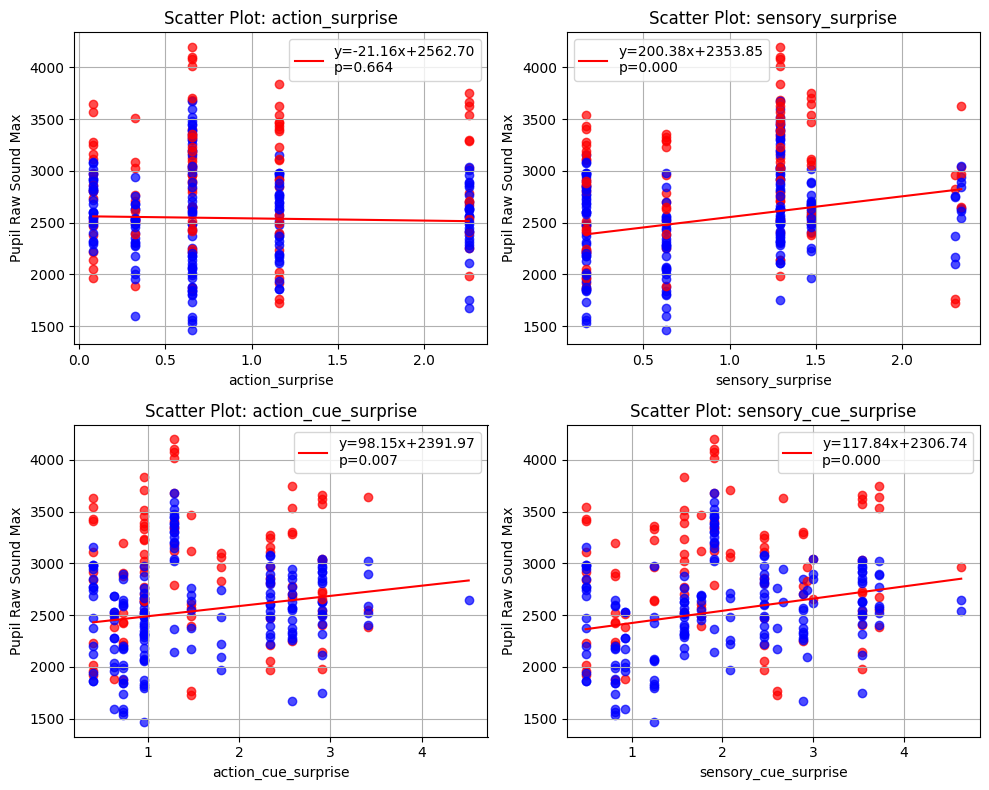

In [401]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Assuming trial_surprise, pupil_raw_sound_max, and keys are already defined

fig, axes = plt.subplots(2, 2, figsize=(10, 8))  # Create 2x2 subplot grid

# Define the index ranges for red dots
index_ranges = [(0, 10), (30, 40), (60, 70), (90, 100), (120, 130), (150, 160), (180, 190), (210, 220), (240, 250)]

for i, ax in enumerate(axes.flat):  
    x = trial_surprise[:, i]
    y = pupil_raw_sound_max
    
    # Identify indices to exclude (the red dots)
    exclude_indices = [idx for idx in range(len(x)) if any(start <= idx <= end for start, end in index_ranges)]
    
    # Filter out the red dots (exclude those indices from x and y)
    x_filtered = np.delete(x, exclude_indices)
    y_filtered = np.delete(y, exclude_indices)

    # Scatter plot with different colors based on index range
    for idx in range(len(x)):
        if any(start <= idx <= end for start, end in index_ranges):  # Check if index is in range
            ax.scatter(x[idx], y[idx], color='red', alpha=0.7)  # Red dots for specific index ranges
        else:
            ax.scatter(x[idx], y[idx], color='blue', alpha=0.7)  # Blue dots for others

    # Perform linear regression on filtered data (excluding red dots)
    slope, intercept, r_value, p_value, std_err = linregress(x_filtered, y_filtered)

    # Plot regression line using the filtered data
    x_vals = np.linspace(min(x_filtered), max(x_filtered), 100)
    y_vals = slope * x_vals + intercept
    ax.plot(x_vals, y_vals, color='red', label=f"y={slope:.2f}x+{intercept:.2f}\np={p_value:.3f}")

    # Labels and title
    ax.set_xlabel(f"{keys[i]}")
    ax.set_ylabel("Pupil Raw Sound Max")
    ax.set_title(f"Scatter Plot: {keys[i]}")
    ax.legend()
    ax.grid(True)

plt.tight_layout()  # Adjust layout for reada


In [402]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from scipy.stats import linregress

# Assuming trial_surprise, pupil_raw_sound_max, and keys are already defined

# Define the index ranges for red dots
index_ranges = [(0, 10), (30, 40), (60, 70), (90, 100), (120, 130), (150, 160), (180, 190), (210, 220), (240, 250)]

# Identify indices to exclude (the red dots)
exclude_indices = [idx for idx in range(len(trial_surprise)) if any(start <= idx <= end for start, end in index_ranges)]

# Filter out the red dots (exclude those indices from trial_surprise and pupil_raw_sound_max)
X_filtered = np.delete(trial_surprise, exclude_indices, axis=0)  # Exclude rows from trial_surprise
y_filtered = np.delete(pupil_raw_sound_max, exclude_indices)  # Exclude corresponding y values (pupil_raw_sound_max)

# Create DataFrame with independent variables (surprise models) from the filtered data
df_surprise_filtered = pd.DataFrame(X_filtered, columns=keys)

# Add constant term for intercept in regression
X_filtered = sm.add_constant(df_surprise_filtered)

# Fit Ordinary Least Squares (OLS) regression on the filtered data
model = sm.OLS(y_filtered, X_filtered).fit()

# Print regression summary
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.111
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     5.175
Date:                Tue, 04 Mar 2025   Prob (F-statistic):           0.000592
Time:                        14:23:16   Log-Likelihood:                -1277.0
No. Observations:                 171   AIC:                             2564.
Df Residuals:                     166   BIC:                             2580.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 2307.4095 

In [404]:
# Number of loops or iterations for the desired index ranges
num_loops = 5  # For example, this gives us 6 different index range definitions

# Placeholder to store all defined index_ranges
all_index_ranges = []

# Loop to define different index ranges
for loop in range(num_loops):
    # Initialize the list to store the ranges for the current loop
    current_ranges = []
    
    # Define start and end values for the ranges
    start_values = range(0, 250, 30)  # Starts at 0, increases by 30 up to 240
    end_values = [start + (5 * (loop + 1)) for start in start_values]  # Increment the end value by 5 for each loop

    # Generate the index ranges for the current loop
    for start, end in zip(start_values, end_values):
        current_ranges.append((start, end))
    
    # Store the current loop's index ranges
    all_index_ranges.append(current_ranges)



Loop 1 index ranges: [(0, 5), (30, 35), (60, 65), (90, 95), (120, 125), (150, 155), (180, 185), (210, 215), (240, 245)]
Loop 2 index ranges: [(0, 10), (30, 40), (60, 70), (90, 100), (120, 130), (150, 160), (180, 190), (210, 220), (240, 250)]
Loop 3 index ranges: [(0, 15), (30, 45), (60, 75), (90, 105), (120, 135), (150, 165), (180, 195), (210, 225), (240, 255)]
Loop 4 index ranges: [(0, 20), (30, 50), (60, 80), (90, 110), (120, 140), (150, 170), (180, 200), (210, 230), (240, 260)]
Loop 5 index ranges: [(0, 25), (30, 55), (60, 85), (90, 115), (120, 145), (150, 175), (180, 205), (210, 235), (240, 265)]


Loop 1 regression summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     6.070
Date:                Tue, 04 Mar 2025   Prob (F-statistic):           0.000121
Time:                        18:22:35   Log-Likelihood:                -1614.3
No. Observations:                 216   AIC:                             3239.
Df Residuals:                     211   BIC:                             3255.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const

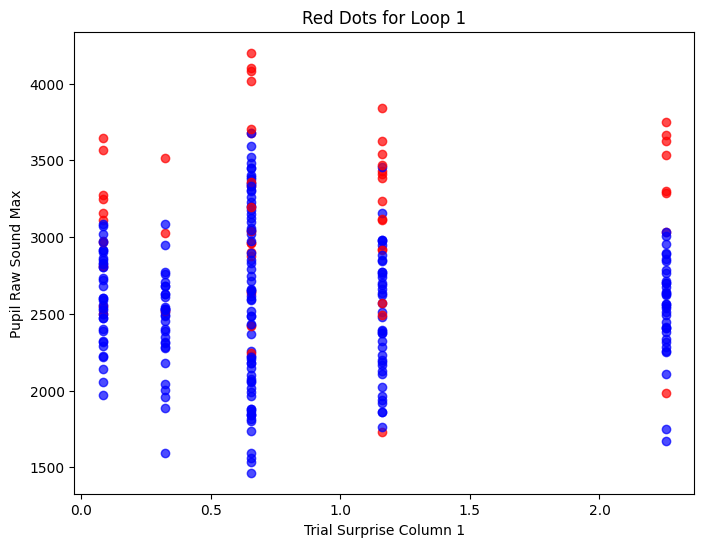

Loop 2 regression summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.111
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     5.175
Date:                Tue, 04 Mar 2025   Prob (F-statistic):           0.000592
Time:                        18:22:38   Log-Likelihood:                -1277.0
No. Observations:                 171   AIC:                             2564.
Df Residuals:                     166   BIC:                             2580.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const

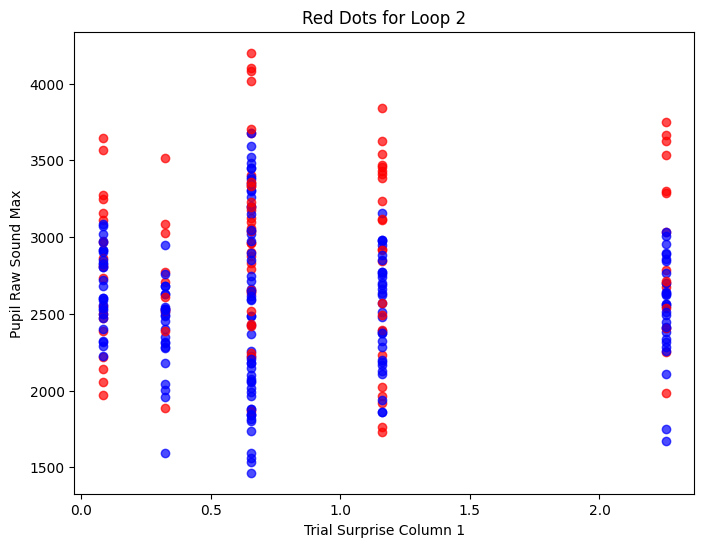

Loop 3 regression summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.086
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     2.843
Date:                Tue, 04 Mar 2025   Prob (F-statistic):             0.0270
Time:                        18:22:43   Log-Likelihood:                -945.70
No. Observations:                 126   AIC:                             1901.
Df Residuals:                     121   BIC:                             1916.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const

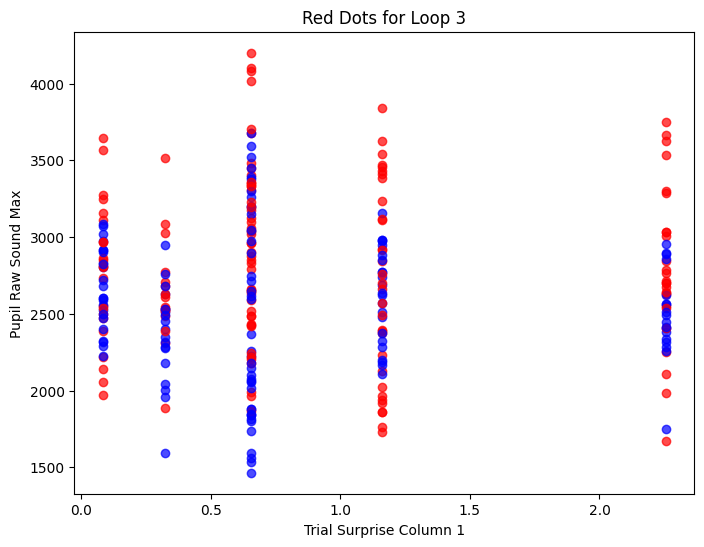

Loop 4 regression summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.057
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     1.152
Date:                Tue, 04 Mar 2025   Prob (F-statistic):              0.339
Time:                        18:22:46   Log-Likelihood:                -607.24
No. Observations:                  81   AIC:                             1224.
Df Residuals:                      76   BIC:                             1236.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const

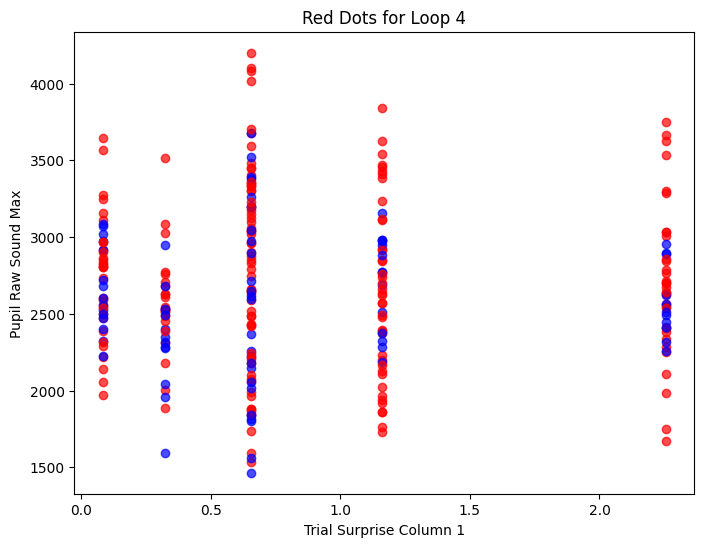

Loop 5 regression summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.045
Model:                            OLS   Adj. R-squared:                 -0.078
Method:                 Least Squares   F-statistic:                    0.3679
Date:                Tue, 04 Mar 2025   Prob (F-statistic):              0.830
Time:                        18:22:48   Log-Likelihood:                -269.66
No. Observations:                  36   AIC:                             549.3
Df Residuals:                      31   BIC:                             557.2
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const

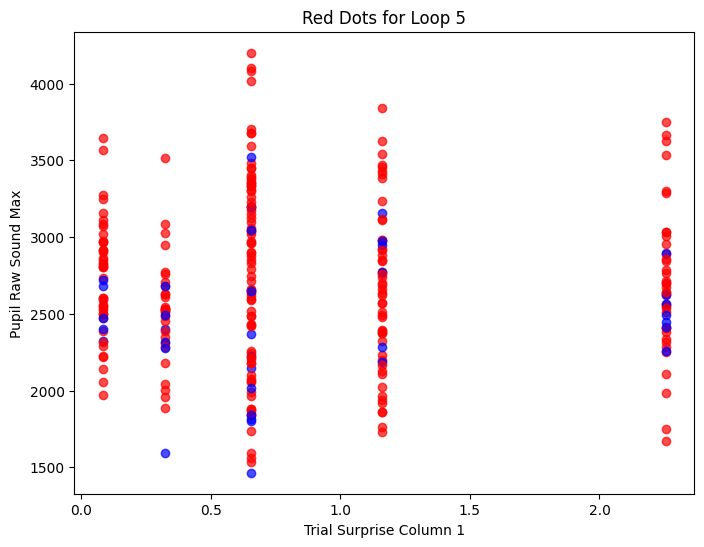

In [421]:
for loop, current_ranges in enumerate(all_index_ranges):
    # Identify indices to exclude (the red dots)
    exclude_indices = [idx for idx in range(len(trial_surprise)) if any(start <= idx <= end for start, end in current_ranges)]

    # Label the red dots (those within the ranges)
    red_dots = np.zeros(len(trial_surprise), dtype=bool)
    red_dots[exclude_indices] = True

    # Filter out the red dots (exclude those indices from trial_surprise and pupil_raw_sound_max)
    X_filtered = np.delete(trial_surprise, exclude_indices, axis=0)  # Exclude rows from trial_surprise
    y_filtered = np.delete(pupil_raw_sound_max, exclude_indices)  # Exclude corresponding y values (pupil_raw_sound_max)

    # Create DataFrame with independent variables (surprise models) from the filtered data
    df_surprise_filtered = pd.DataFrame(X_filtered, columns=keys)

    # Add constant term for intercept in regression
    X_filtered = sm.add_constant(df_surprise_filtered)

    # Fit Ordinary Least Squares (OLS) regression on the filtered data
    model = sm.OLS(y_filtered, X_filtered).fit()

    # Print regression summary to examine R² and other statistics
    print(f"Loop {loop + 1} regression summary:")
    print(model.summary())

    # Optionally, return R² value for quick comparison
    print(f"Loop {loop + 1} R²: {model.rsquared:.4f}")

    # Plot the red dots (labeling the dots as red)
    plt.figure(figsize=(8, 6))
    for i in range(len(trial_surprise)):
        color = 'red' if red_dots[i] else 'blue'  # Red if it's a red dot
        plt.scatter(trial_surprise[i, 0], pupil_raw_sound_max[i], color=color, alpha=0.7)
    plt.xlabel('Trial Surprise Column 1')  # Replace with the desired column
    plt.ylabel('Pupil Raw Sound Max')
    plt.title(f"Red Dots for Loop {loop + 1}")
    plt.show()

In [408]:


# Number of loops or iterations for the desired index ranges
num_loops = 5  # Define the number of loops you want

# Placeholder to store all defined index_ranges
all_index_ranges = []

# Loop to define different index ranges
for loop in range(num_loops):
    # Initialize the list to store the ranges for the current loop
    current_ranges = []
    
    # Define start and end values for the ranges
    start_values = range(0, 250, 30)  # Starts at 0, increases by 30 up to 240
    end_values = [start + (5 * (loop + 1)) for start in start_values]  # Increment the end value by 5 for each loop

    # Generate the index ranges for the current loop
    for start, end in zip(start_values, end_values):
        current_ranges.append((start, end))
    
    # Store the current loop's index ranges
    all_index_ranges.append(current_ranges)

# Define the trial_surprise, pupil_raw_sound_max, and keys for demonstration
# trial_surprise = np.random.rand(270, 4)  # Replace with actual trial_surprise data
# pupil_raw_sound_max = np.random.rand(270)  # Replace with actual pupil data
# keys = ['action_surprise', 'sensory_surprise', 'action_cue_surprise', 'sensory_cue_surprise']  # Replace with actual keys

# List to store R² values for each loop
r_squared_values = []

# Loop through all index ranges and perform regression
for loop, current_ranges in enumerate(all_index_ranges):
    # Identify indices to exclude (the red dots)
    exclude_indices = [idx for idx in range(len(trial_surprise)) if any(start <= idx <= end for start, end in current_ranges)]

    # Label the red dots (those within the ranges)
    red_dots = np.zeros(len(trial_surprise), dtype=bool)
    red_dots[exclude_indices] = True

    # Filter out the red dots (exclude those indices from trial_surprise and pupil_raw_sound_max)
    X_filtered = np.delete(trial_surprise, exclude_indices, axis=0)  # Exclude rows from trial_surprise
    y_filtered = np.delete(pupil_raw_sound_max, exclude_indices)  # Exclude corresponding y values (pupil_raw_sound_max)

    # Create DataFrame with independent variables (surprise models) from the filtered data
    df_surprise_filtered = pd.DataFrame(X_filtered, columns=keys)

    # Add constant term for intercept in regression
    X_filtered = sm.add_constant(df_surprise_filtered)

    # Fit Ordinary Least Squares (OLS) regression on the filtered data
    model = sm.OLS(y_filtered, X_filtered).fit()

    # Record the R² value
    r_squared_values.append(model.rsquared)

# After the loop, print the list of R² values
print("R² values for each loop:")
for idx, r2 in enumerate(r_squared_values):
    print(f"Loop {idx + 1}: R² = {r2:.4f}")


R² values for each loop:
Loop 1: R² = 0.1032
Loop 2: R² = 0.1109
Loop 3: R² = 0.0859
Loop 4: R² = 0.0572
Loop 5: R² = 0.0453


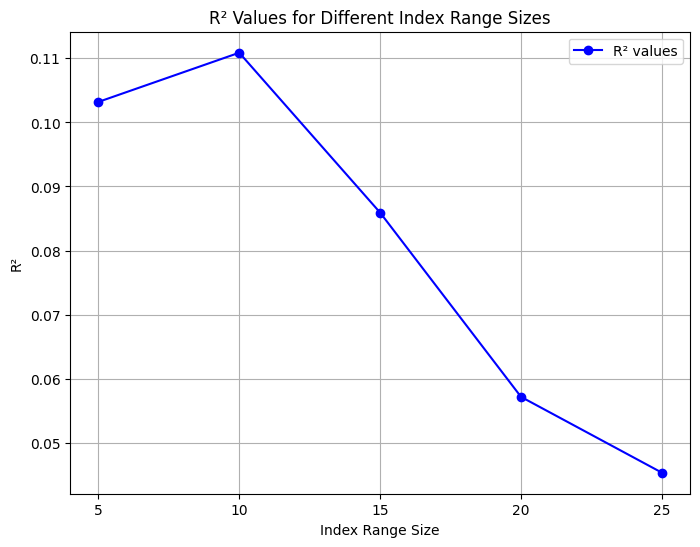

In [410]:
import matplotlib.pyplot as plt

# Define custom x-axis values
x_ticks = [5, 10, 15, 20, 25]

# Ensure that the number of loops matches the length of x_ticks
if len(r_squared_values) != len(x_ticks):
    raise ValueError("The number of loops must match the number of x_ticks.")

# Plot R² values for each loop
plt.figure(figsize=(8, 6))
plt.plot(x_ticks, r_squared_values, marker='o', linestyle='-', color='b', label='R² values')
plt.xlabel('Number of trials excluded at the begining')
plt.ylabel('R²')
plt.title('R² Values for Different Index Range Sizes')
plt.xticks(x_ticks)
plt.grid(True)
plt.legend()
plt.show()


R² value with all data (without excluding any red dots):
All Data: R² = 0.0644

R² values for each loop after excluding red dots:
Loop 1: R² = 0.1032
Loop 2: R² = 0.1109
Loop 3: R² = 0.0859
Loop 4: R² = 0.0572
Loop 5: R² = 0.0453


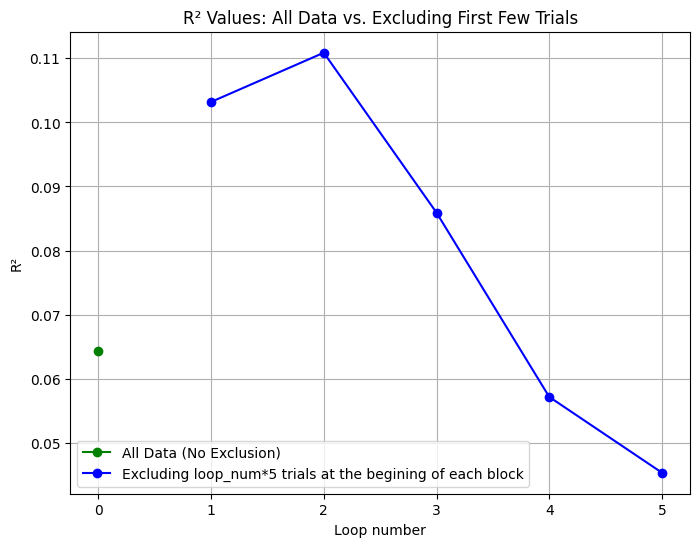

In [418]:

# Number of loops or iterations for the desired index ranges
num_loops = 5  # Define the number of loops you want

# Placeholder to store all defined index_ranges
all_index_ranges = []

# Loop to define different index ranges
for loop in range(num_loops):
    # Initialize the list to store the ranges for the current loop
    current_ranges = []
    
    # Define start and end values for the ranges
    start_values = range(0, 250, 30)  # Starts at 0, increases by 30 up to 240
    end_values = [start + (5 * (loop + 1)) for start in start_values]  # Increment the end value by 5 for each loop

    # Generate the index ranges for the current loop
    for start, end in zip(start_values, end_values):
        current_ranges.append((start, end))
    
    # Store the current loop's index ranges
    all_index_ranges.append(current_ranges)

# Define the trial_surprise, pupil_raw_sound_max, and keys for demonstration
# trial_surprise = np.random.rand(270, 4)  # Replace with actual trial_surprise data
# pupil_raw_sound_max = np.random.rand(270)  # Replace with actual pupil data
# keys = ['action_surprise', 'sensory_surprise', 'action_cue_surprise', 'sensory_cue_surprise']  # Replace with actual keys

# List to store R² values for each loop
r_squared_values_all_data = []

# First, perform regression with all data points (without excluding any)
X_all_data = sm.add_constant(pd.DataFrame(trial_surprise, columns=keys))  # Add constant for intercept
model_all_data = sm.OLS(pupil_raw_sound_max, X_all_data).fit()

# Record the R² value for all data
r_squared_values_all_data.append(model_all_data.rsquared)

# Loop through all index ranges and perform regression excluding the red dots
r_squared_values_excluding_red_dots = []

for loop, current_ranges in enumerate(all_index_ranges):
    # Identify indices to exclude (the red dots)
    exclude_indices = [idx for idx in range(len(trial_surprise)) if any(start <= idx <= end for start, end in current_ranges)]

    # Label the red dots (those within the ranges)
    red_dots = np.zeros(len(trial_surprise), dtype=bool)
    red_dots[exclude_indices] = True

    # Filter out the red dots (exclude those indices from trial_surprise and pupil_raw_sound_max)
    X_filtered = np.delete(trial_surprise, exclude_indices, axis=0)  # Exclude rows from trial_surprise
    y_filtered = np.delete(pupil_raw_sound_max, exclude_indices)  # Exclude corresponding y values (pupil_raw_sound_max)

    # Create DataFrame with independent variables (surprise models) from the filtered data
    df_surprise_filtered = pd.DataFrame(X_filtered, columns=keys)

    # Add constant term for intercept in regression
    X_filtered = sm.add_constant(df_surprise_filtered)

    # Fit Ordinary Least Squares (OLS) regression on the filtered data
    model = sm.OLS(y_filtered, X_filtered).fit()

    # Record the R² value
    r_squared_values_excluding_red_dots.append(model.rsquared)

    # # Plot the red dots (labeling the dots as red)
    # plt.figure(figsize=(8, 6))
    # for i in range(len(trial_surprise)):
    #     color = 'red' if red_dots[i] else 'blue'  # Red if it's a red dot
    #     plt.scatter(trial_surprise[i, 0], pupil_raw_sound_max[i], color=color, alpha=0.7)
    # plt.xlabel('Trial Surprise Column 1')  # Replace with the desired column
    # plt.ylabel('Pupil Raw Sound Max')
    # plt.title(f"Red Dots for Loop {loop + 1}")
    # plt.show()

# After the loop, print the list of R² values for both with all data and excluding red dots
print("R² value with all data (without excluding any red dots):")
print(f"All Data: R² = {r_squared_values_all_data[0]:.4f}")

print("\nR² values for each loop after excluding red dots:")
for idx, r2 in enumerate(r_squared_values_excluding_red_dots):
    print(f"Loop {idx + 1}: R² = {r2:.4f}")

# Plotting the R² values for all data and excluding red dots
plt.figure(figsize=(8, 6))
plt.plot([0], r_squared_values_all_data, marker='o', linestyle='-', color='g', label='All Data (No Exclusion)')
plt.plot(range(1, num_loops + 1), r_squared_values_excluding_red_dots, marker='o', linestyle='-', color='b', label='Excluding loop_num*5 trials at the begining of each block')
plt.xlabel('Loop number')
plt.ylabel('R²')
plt.title('R² Values: All Data vs. Excluding First Few Trials')
plt.xticks([0] + list(range(1, num_loops + 1)))
plt.grid(True)
plt.legend()
plt.show()
